# Substitution patterns around hotspots

In [1]:
from scipy import signal, stats
import numpy as np
import pandas as pd
import bisect
import importlib
import warnings
from pathlib import Path
import gc

import ete3
np.random.seed(7)

import psutil, os
def mem():
    return psutil.Process(os.getpid()).memory_info().rss / 1024**3

Plotting setup:

In [2]:
%matplotlib inline

# Make inline plots vector graphics instead of raster graphics
from IPython.display import set_matplotlib_formats
#set_matplotlib_formats('pdf', 'svg')
set_matplotlib_formats('retina', 'png')

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Rectangle
from matplotlib.lines import Line2D

#matplotlib.rcParams['figure.figsize'] = (20.0, 10.0)

import mpld3

import seaborn as sns
sns.set() # sets seaborn default "prettyness:
sns.set_style("white")
sns.set_context("notebook")

# lowess for plotting
from statsmodels.nonparametric.smoothers_lowess import lowess


def abline(slope, intercept, ax=None):
    "Add a straight line through the plot"
    if ax is None:
        ax = plt.gca()
    x_vals = np.array(ax.get_xlim())
    y_vals = intercept + slope * x_vals
    ax.plot(x_vals, y_vals, '--', color='grey')
    
def add_lowess(x, y, ax=None, color=None, is_sorted=True, frac=0.005, it=0, **kwargs):
    "Add a lowess curve to the plot"
    if ax is None:
        ax = plt.gca() 
    filtered = lowess(y, x, is_sorted=is_sorted, frac=frac, it=it, **kwargs)
    ax.plot(filtered[:,0], filtered[:,1])

def add_band(x_low, x_high, ax=None, color='gray', linewidth=0, alpha=0.5, zorder=0, **kwargs):
    "Plot a gray block on x interval"
    if ax is None:
        ax = plt.gca()
    y_low, y_high = ax.get_ylim()
    g = ax.add_patch(Rectangle((x_low, y_low), x_high-x_low, y_high-y_low, 
                 facecolor=color,
                 linewidth=linewidth,
                 alpha=alpha,
                 zorder=zorder))

def stairs(df, start='start', end='end', pos='pos', endtrim=0):
    "Turn a df with start, end into one with pos to plot as stairs"
    df1 = df.copy(deep=True)
    df2 = df.copy(deep=True)
    df1[pos] = df1[start]
    df2[pos] = df2[end] - endtrim
    return pd.concat([df1, df2]).sort_values([start, end])

# My own paired palette replacing the last brown pair with violets
sns.color_palette('Paired').as_hex()
Paired = sns.color_palette(['#a6cee3', '#1f78b4', '#b2df8a', '#33a02c', '#fb9a99', '#e31a1c',
                            '#fdbf6f', '#ff7f00', '#cab2d6','#6a3d9a', '#e585cf', '#ad009d'])
#sns.palplot(Paired)

Monospace font for numbers in tables:

In [3]:
%%html
<style> table { font-variant-numeric: tabular-nums; } </style>

Function for reducing memory of data frames:

In [4]:
def optimize_data_frame(df, inplace=False, down_int='integer'):
    # down_int can be 'unsigned'
    
    if inplace:
        converted_df = df
    else:
        converted_df = pd.DataFrame()

    floats_optim = (df
                    .select_dtypes(include=['float'])
                    .apply(pd.to_numeric,downcast='float')
                   )
    converted_df[floats_optim.columns] = floats_optim

    ints_optim = (df
                    .select_dtypes(include=['int'])
                    .apply(pd.to_numeric,downcast=down_int)
                   )
    converted_df[ints_optim.columns] = ints_optim

    for col in df.select_dtypes(include=['object']).columns:
        num_unique_values = len(df[col].unique())
        num_total_values = len(df[col])
        if num_unique_values / num_total_values < 0.5:
            converted_df[col] = df[col].astype('category')
        else:
            converted_df[col] = df[col]

    unchanged_cols = df.columns[~df.columns.isin(converted_df.columns)]
    converted_df[unchanged_cols] = df[unchanged_cols]

    # keep columns order
    converted_df = converted_df[df.columns]      
            
    return converted_df

## Paths to data and results

In [5]:
data_path = Path('/project/Birds/faststorage/data')
results_path = Path('/project/Birds/faststorage/people/kmt/bird-hotspots/results')

## Load substitution data

Define column sets:

In [6]:
base_counts = ['nA', 'nG', 'nT', 'nC']

substitution_counts =  ['nA2C', 'nA2G', 'nA2T', 'nC2A', 'nC2G', 'nC2T',
                        'nG2A', 'nG2C', 'nG2T', 'nT2A', 'nT2C', 'nT2G']
cpg_substitution_counts =  ['nA2c', 'nA2g', 'nc2A', 'nc2g', 'nc2T',
                            'ng2A', 'ng2c', 'ng2T', 'nT2c', 'nT2g']
# in paired order
substitutions = ['rA2C', 'rT2G',
                 'rC2T', 'rG2A',
                 'rA2G', 'rT2C',
                 'rA2T', 'rT2A', 
                 'rC2A', 'rG2T',
                 'rC2G', 'rG2C']
# cpg_substitutions = ['rA2c', 'rT2g',
#                      'rc2T', 'rg2A',
#                      'rA2g', 'rT2c',
#                      'rc2A', 'rg2T',
#                      'rc2g', 'rg2c']


transitions = ['rA2G', 'rG2A', 'rT2C', 'rC2T']
# cpg_transitions = ['rA2g', 'rg2A', 'rT2c', 'rc2T']

transversions = [x for x in substitutions if x not in transitions]
# cpg_transversions = [x for x in cpg_substitutions if x not in cpg_transitions]

paired_patterns = [('rT2G', 'rA2C'),
                   ('rA2G', 'rT2C'),
                   ('rA2T', 'rT2A'), 
                   ('rG2T', 'rC2A'),
                   ('rC2G', 'rG2C'), 
                   ('rC2T', 'rG2A')]
# cpg_paired_patterns = [('rT2g', 'rA2c'),
#                        ('rA2g', 'rT2c'),
#                        ('rg2T', 'rc2A'),
#                        ('rc2g', 'rg2c'), 
#                        ('rc2T', 'rg2A')]

Read data, but exclude one of the eagles. We also exclude windows smaller than 1000. These are split windows overlapping midpoint between two hotspots.

In [7]:
def data_filter(df):
    include_species = ~df.species.isin(['HALAL'])
    win_size = (df.end - df.start).abs()
    include_window = (win_size == 1000) | (win_size == 0)
    return include_species & include_window
    
hotspot_data = (pd.read_hdf(results_path / 'hotspot_data.h5')
                .loc[data_filter]
               )
# remove the eagle from categories:
hotspot_data.species.cat.remove_unused_categories(inplace=True)

In [8]:
hotspot_data['hotspot_center'] = (hotspot_data.start_prox + (hotspot_data.end_prox - hotspot_data.start_prox) / 2).astype('int32')

------

In [9]:
# df_0 = hotspot_data.loc[(hotspot_data.bin == 0)]
# dp = df_0.duplicated(subset=['chrom', 'species', 'hotspot_center'])
# df_0.loc[dp, ['chrom', 'species', 'hotspot_center']].reset_index().sort_values(['chrom', 'species', 'hotspot_center'])

In [10]:
# df_0.loc[df_0.hotspot_center == 11341000, ['bin', 'chrom', 'species', 'start', 'end', 'pos', 'start_orig', 'end_orig', 'start_prox', 'end_prox']]

In [11]:
# hotspot_data.loc[hotspot_data.bin == 0].groupby(['chrom', 'species', 'hotspot_center']).nA.count().loc[lambda x: x != 1]

In [12]:
# #hotspot_data.loc[hotspot_data.bin.abs() < 10000].groupby('bin').hotspot_center.agg(lambda x: x.unique())
# hotspot_data.loc[hotspot_data.bin.abs() < 10000].groupby('bin').hotspot_center.agg(lambda x: x.unique().size)

----

Add species names:

In [13]:
species_details = pd.read_csv('/home/kmt/Birds/faststorage/data/species_details.txt', sep='\t')

hotspot_data['species_code'] = hotspot_data.species
name_mapping = dict(zip(species_details.species2014, species_details.english))
hotspot_data['species'] = [name_mapping[x] for x in hotspot_data.species_code]

hotspot_data['species'] = hotspot_data['species'].astype('category')

Compute the number of aligned bases in each window:

In [14]:
hotspot_data['nr_aligned'] = hotspot_data[base_counts].sum(axis=1)

Compute substitution rates across each external branch by dividing substitution counts by the ancestral count of the base substituted from:

In [15]:
for subst in substitution_counts:
    from_base, to_base = subst[1], subst[3]
    
    adding_subst = [x for x in substitution_counts if x[3] == from_base]
    removing_subst = [x for x in substitution_counts if x[1] == from_base]
    
    hotspot_data[subst.replace('n', 'r')] = hotspot_data[subst] / \
        (hotspot_data['n' + from_base] - hotspot_data[adding_subst].sum(axis=1) + hotspot_data[removing_subst].sum(axis=1))

In [16]:
len(hotspot_data.species.unique())

47

In [17]:
hotspot_data.head()

,ancestor,bin,chrom,end,end_orig,end_prox,nA,nA2C,nA2G,nA2T,...,rA2T,rC2A,rC2G,rC2T,rG2A,rG2C,rG2T,rT2A,rT2C,rT2G
0,Anc34,0.0,1,0,6895000,6894116,41,0,2,0,...,0.000000,0.020408,0.000000,0.040816,0.024390,0.000000,0.024390,0.000000,0.000000,0.000000
1,Anc34,0.0,1,0,8806000,8805005,280,2,6,1,...,0.003521,0.000000,0.007353,0.029412,0.033784,0.000000,0.006757,0.000000,0.008811,0.004405
2,Anc34,0.0,1,0,9688000,9687030,274,1,6,4,...,0.014388,0.000000,0.016575,0.011050,0.024272,0.004854,0.009709,0.006873,0.013746,0.017182
3,Anc34,0.0,1,0,10398000,10397061,262,0,7,2,...,0.007576,0.004831,0.014493,0.024155,0.023121,0.011561,0.005780,0.007067,0.007067,0.000000
4,Anc34,0.0,1,0,10504000,10503751,104,2,2,0,...,0.000000,0.008403,0.000000,0.016807,0.018182,0.009091,0.000000,0.020408,0.030612,0.020408


Make a copy of the entire data frame and do the same but including CpG sites:

In [18]:
hotspot_data_incl_cpg = hotspot_data.copy(deep=True)

for subst in substitution_counts:
    from_base, to_base = subst[1], subst[3]
    
    adding_subst = [x for x in substitution_counts+cpg_substitution_counts if x[3].upper() == from_base]
    removing_subst = [x for x in substitution_counts+cpg_substitution_counts if x[1].upper() == from_base]
    
    same_subst = [x for x in substitution_counts+cpg_substitution_counts if x[1:].upper() == subst[1:]]
   
    from_base_count = hotspot_data['n' + from_base]
    if from_base in 'GC':
        from_base_count += hotspot_data['n' + from_base.lower()]

    hotspot_data_incl_cpg[subst.replace('n', 'r')] = hotspot_data[same_subst].sum(axis=1) / \
            (from_base_count - hotspot_data[adding_subst].sum(axis=1) + hotspot_data[removing_subst].sum(axis=1))    

In [19]:
hotspot_data_incl_cpg.head()

,ancestor,bin,chrom,end,end_orig,end_prox,nA,nA2C,nA2G,nA2T,...,rA2T,rC2A,rC2G,rC2T,rG2A,rG2C,rG2T,rT2A,rT2C,rT2G
0,Anc34,0.0,1,0,6895000,6894116,41,0,2,0,...,0.000000,0.019608,0.000000,0.035088,0.023256,0.000000,0.020408,0.000000,0.017857,0.000000
1,Anc34,0.0,1,0,8806000,8805005,280,2,6,1,...,0.003497,0.000000,0.005988,0.027174,0.036810,0.000000,0.005076,0.000000,0.021739,0.008696
2,Anc34,0.0,1,0,9688000,9687030,274,1,6,4,...,0.014337,0.000000,0.014354,0.017778,0.031674,0.004219,0.007905,0.006780,0.030508,0.020339
3,Anc34,0.0,1,0,10398000,10397061,262,0,7,2,...,0.007463,0.004405,0.016129,0.018587,0.031579,0.009434,0.004274,0.007018,0.014035,0.000000
4,Anc34,0.0,1,0,10504000,10503751,104,2,2,0,...,0.000000,0.021429,0.000000,0.017045,0.030769,0.006757,0.000000,0.020619,0.030928,0.020619


In [20]:
mem()

14.0108642578125

Make a long format data frames with substitution rate data within 50kb from each hotspot:

In [21]:
id_cols = ['species', 'species_code', 'ancestor', 'hotspot_center', 'bin', 'branch_length', 'ultra_branch_length', 'nr_aligned']
subst_data = (hotspot_data
              .loc[lambda df: df.bin.abs() <= 40000, id_cols + substitutions + base_counts]
              .melt(id_vars=id_cols,
                    value_vars=substitutions,
                    var_name='pattern', value_name='rate')
             )
subst_data['pattern'] = pd.Categorical(subst_data.pattern.values, 
                                       categories=substitutions, ordered=True)
subst_data.loc[subst_data.pattern.isin(transitions), 'type'] = 'Transition'
subst_data.loc[~subst_data.pattern.isin(transitions), 'type'] = 'Transversion'
subst_data['type'] = pd.Categorical(subst_data.type.values, categories=['Transition', 'Transversion'], ordered=True)
subst_data.head()

,species,species_code,ancestor,hotspot_center,bin,branch_length,ultra_branch_length,nr_aligned,pattern,rate,type
0,Northern Fulmar,FULGL,Anc34,6894116,0.0,0.034161,0.060779,186,rA2C,0.000000,Transversion
1,Northern Fulmar,FULGL,Anc34,8805005,0.0,0.034161,0.060779,795,rA2C,0.007042,Transversion
2,Northern Fulmar,FULGL,Anc34,9687030,0.0,0.034161,0.060779,956,rA2C,0.003597,Transversion
3,Northern Fulmar,FULGL,Anc34,10397061,0.0,0.034161,0.060779,927,rA2C,0.000000,Transversion
4,Northern Fulmar,FULGL,Anc34,10503751,0.0,0.034161,0.060779,430,rA2C,0.019417,Transversion


In [22]:
subst_data_incl_cpg = (hotspot_data_incl_cpg
              .loc[lambda df: df.bin.abs() <= 40000, id_cols + substitutions + base_counts]
              .melt(id_vars=id_cols,
                    value_vars=substitutions,
                    var_name='pattern', value_name='rate')
             )
subst_data_incl_cpg['pattern'] = pd.Categorical(subst_data_incl_cpg.pattern.values, 
                                       categories=substitutions, ordered=True)
subst_data_incl_cpg.loc[subst_data.pattern.isin(transitions), 'type'] = 'Transition'
subst_data_incl_cpg.loc[~subst_data.pattern.isin(transitions), 'type'] = 'Transversion'
subst_data_incl_cpg['type'] = pd.Categorical(subst_data_incl_cpg.type.values, categories=['Transition', 'Transversion'], ordered=True)
subst_data_incl_cpg.head()

,species,species_code,ancestor,hotspot_center,bin,branch_length,ultra_branch_length,nr_aligned,pattern,rate,type
0,Northern Fulmar,FULGL,Anc34,6894116,0.0,0.034161,0.060779,186,rA2C,0.000000,Transversion
1,Northern Fulmar,FULGL,Anc34,8805005,0.0,0.034161,0.060779,795,rA2C,0.010490,Transversion
2,Northern Fulmar,FULGL,Anc34,9687030,0.0,0.034161,0.060779,956,rA2C,0.007168,Transversion
3,Northern Fulmar,FULGL,Anc34,10397061,0.0,0.034161,0.060779,927,rA2C,0.000000,Transversion
4,Northern Fulmar,FULGL,Anc34,10503751,0.0,0.034161,0.060779,430,rA2C,0.020202,Transversion


## Number of aligned bases in each 1kb window

Distribution of number of aligned bases in windows for TAEGU:

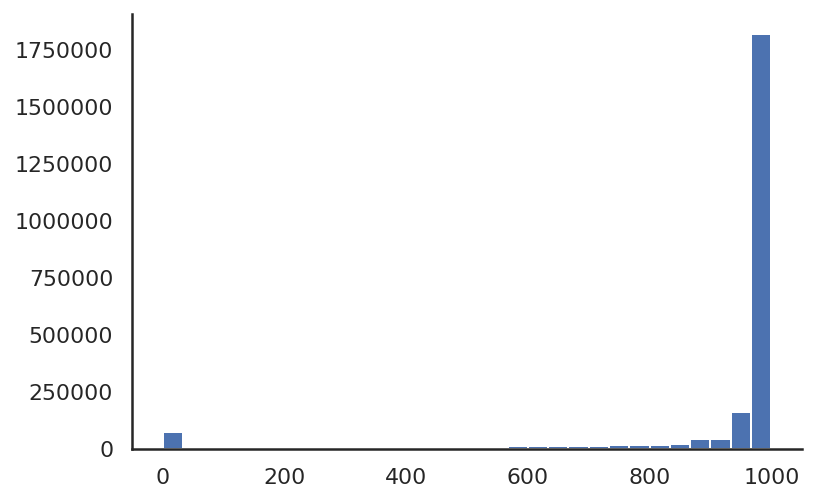

In [23]:
plt.hist(subst_data.loc[subst_data.species_code == 'TAEGU'].nr_aligned, bins=30)
sns.despine()

Distribution of number of aligned bases in windows for all others:

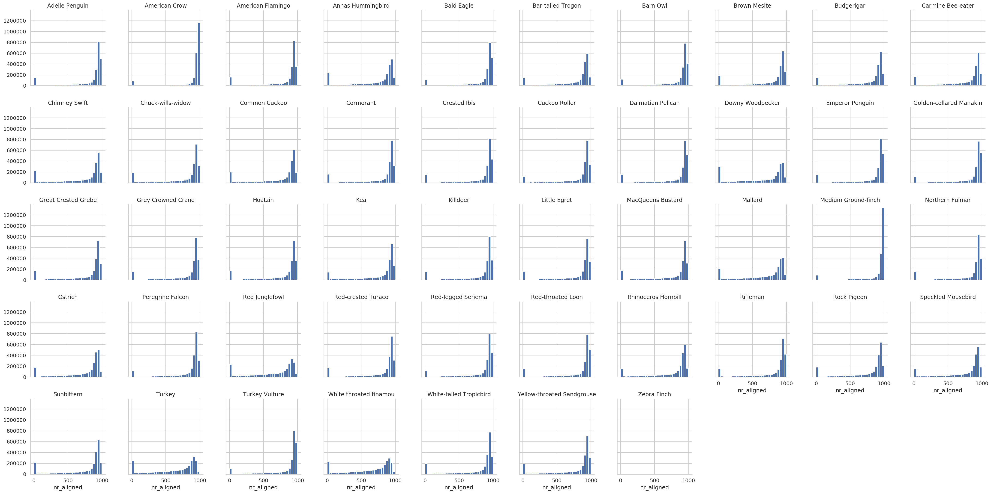

In [24]:
with sns.axes_style('whitegrid'):
    g = sns.FacetGrid(subst_data.loc[subst_data.species_code != 'TAEGU'], col='species', col_wrap=10, sharey=True)
    g.map(plt.hist, 'nr_aligned', bins=30).add_legend()
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}') ;

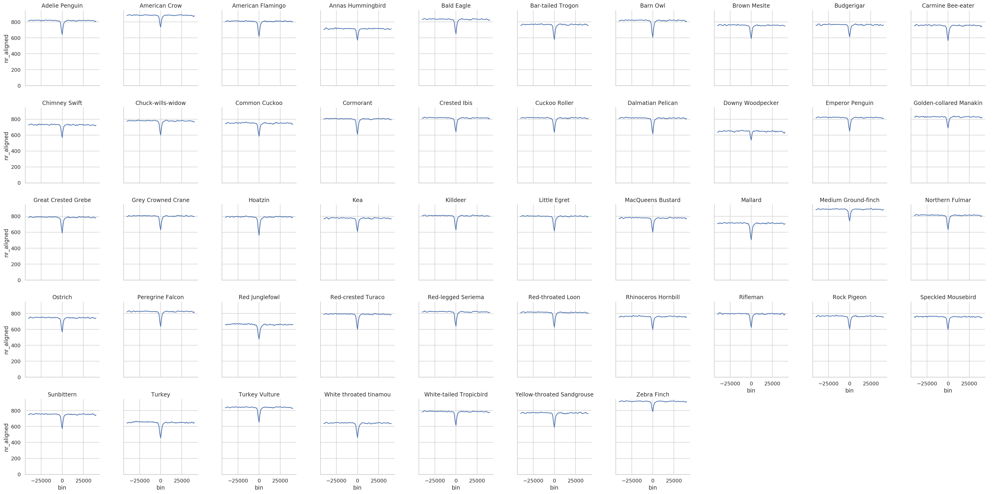

In [25]:
with sns.axes_style('whitegrid'):
    g = sns.FacetGrid(subst_data,
                      col='species', col_wrap=10, sharey=True)
    g.map(sns.lineplot, 'bin', 'nr_aligned', ci=None).add_legend()
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}') ;
    [ax.set_ylim(bottom=0) for ax in g.axes.flat]

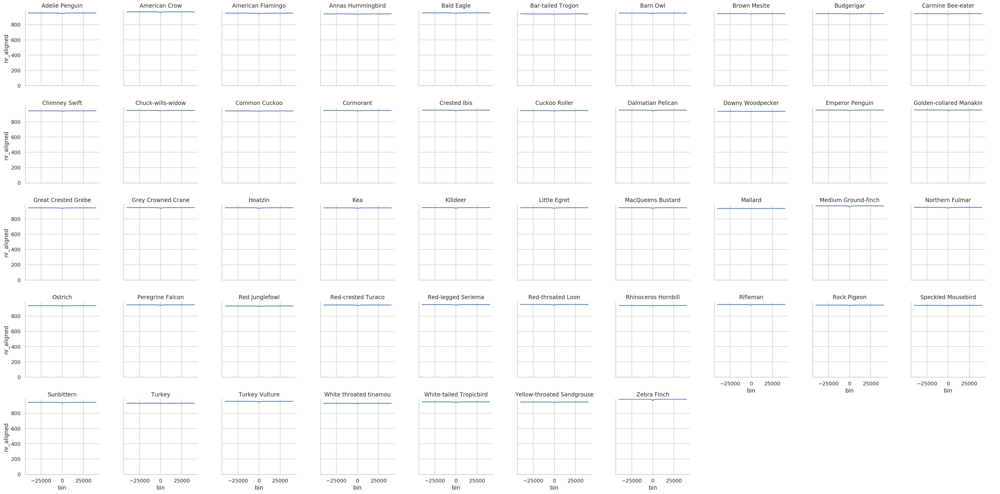

In [26]:
with sns.axes_style('whitegrid'):
    g = sns.FacetGrid(subst_data.loc[subst_data.nr_aligned >= 900],
                      col='species', col_wrap=10, sharey=True)
    g.map(sns.lineplot, 'bin', 'nr_aligned', ci=None).add_legend()
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}') ;
    [ax.set_ylim(bottom=0) for ax in g.axes.flat]

It seems there are important differences in the alignemnt quality in the different species. Especially with some of the long branches. 

We will be asked how much of the differences we find are due to misalignemnts. Th that we can say that any misalignment to inflate all substitution rates at hotspots not just a few. As we show further down, the A2T and T2A substitution rates are constant across the hotspots.

## Filter out low coverage windows

We use only windows where with at least 300 aligned bases. (below we also test if this cutoff matters to the patterns observed)

In [27]:
removed_rows = subst_data[subst_data.nr_aligned < 300].index
subst_data.drop(removed_rows, inplace=True)
removed_rows = subst_data_incl_cpg[subst_data_incl_cpg.nr_aligned < 300].index
subst_data_incl_cpg.drop(removed_rows, inplace=True)

## Normalize rates with branch length

Normalize each substitution rate with a global mutation rate divided by the external branch length. 

By dividing by branch length we take variation in overall subsititution rate into account. This should make the summed substitituion rates outside hotspots should be the same across species.

In [28]:
# subst_data['rate'] *= 2.3e-9 / subst_data.branch_length * 1e9 
subst_data['rate'] /= subst_data.branch_length
subst_data_incl_cpg['rate'] /= subst_data_incl_cpg.branch_length

optimize_data_frame(subst_data, inplace=True)
optimize_data_frame(subst_data_incl_cpg, inplace=True)
subst_data.head()

,species,species_code,ancestor,hotspot_center,bin,branch_length,ultra_branch_length,nr_aligned,pattern,rate,type
1,Northern Fulmar,FULGL,Anc34,8805005,0.0,0.034161,0.060779,795,rA2C,0.206151,Transversion
2,Northern Fulmar,FULGL,Anc34,9687030,0.0,0.034161,0.060779,956,rA2C,0.105300,Transversion
3,Northern Fulmar,FULGL,Anc34,10397061,0.0,0.034161,0.060779,927,rA2C,0.000000,Transversion
4,Northern Fulmar,FULGL,Anc34,10503751,0.0,0.034161,0.060779,430,rA2C,0.568418,Transversion
6,Northern Fulmar,FULGL,Anc34,10878154,0.0,0.034161,0.060779,926,rA2C,0.259824,Transversion


See if the summed substitituion rates outside hotspots are the same across species:

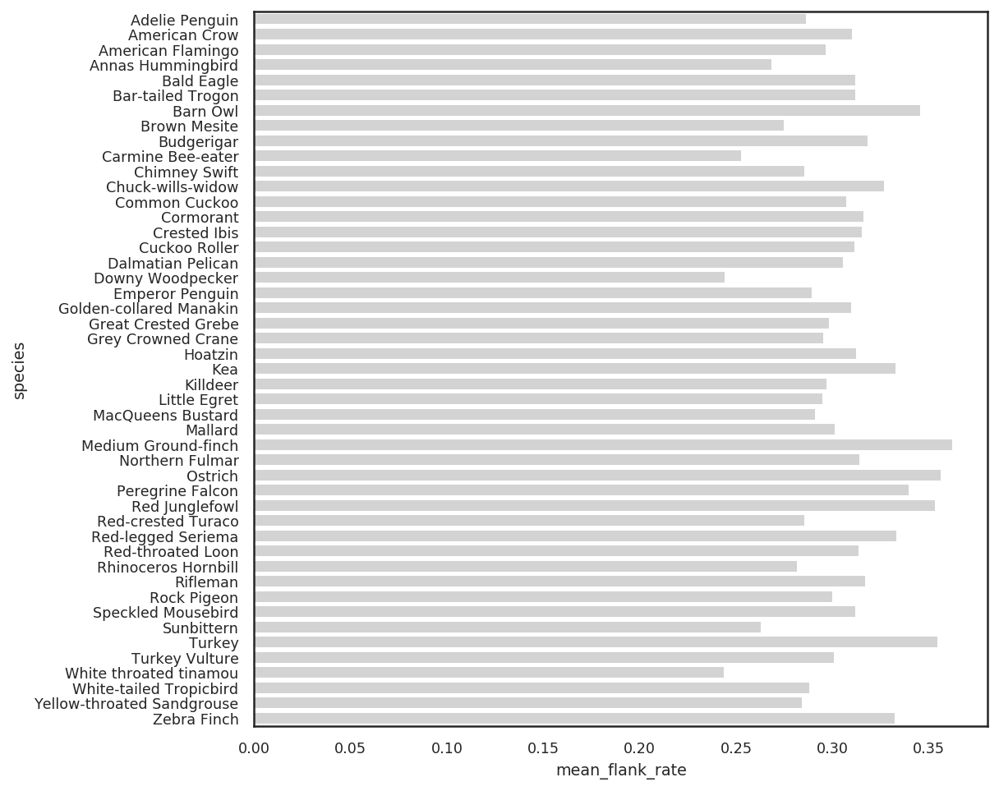

In [29]:
mean_flank_rates = (subst_data
                    .loc[subst_data.bin.abs() > 20000]
                    .groupby('species')
                    .rate
                    .mean()
                    .reset_index()
                    .rename(columns={'rate': 'mean_flank_rate'})
                    )
with sns.plotting_context('notebook', font_scale=0.8):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax = sns.barplot(y="species", x="mean_flank_rate", data=mean_flank_rates, color='lightgrey')

It does not seem to be the case... 

**TODO: Maybe it would make more sense to normalize rates with the summed rates outside hotspots, since we are only interested in the relative rates:**


In [30]:
# subst_data = subst_data.merge(mean_flank_rates, on=['species'], how='left')

In [31]:
# # undo prev normalization
# subst_data['rate'] /= 2.3e-9 / subst_data.branch_length * 1e9 

# # normalize by mean flank rate of all substitutions
# subst_data['rate'] /= subst_data.mean_flank_rate / 12

In [32]:
# mean_flank_rates_redone = (subst_data
#                     .loc[subst_data.bin.abs() > 20000]
#                     .groupby('species')
#                     .rate
#                     .mean()
#                     .reset_index()
#                     .rename(columns={'rate': 'mean_flank_rate'})
#                     )
# with sns.plotting_context('notebook', font_scale=0.8):
#     fig, ax = plt.subplots(figsize=(8, 8))
#     ax = sns.barplot(y="species", x="mean_flank_rate", data=mean_flank_rates_redone, color='lightgrey')

## Hotspot distance to center of closest CGI, TSS, TES, and promoter

In [33]:
def read_dist_data(file_name):
    del_cols = ['pos', 'start', 'end', 'start_prox', 'end_prox', 'start_orig', 'end_orig']
    return (pd.read_csv(file_name, sep='\t')
            .assign(
                    hotspot_center=lambda df: (df.start_orig + (df.end_orig - df.start_orig) / 2).astype('int32'),
                    dist=lambda df: (df.start.abs()+(df.end.abs()-df.start.abs())/2).astype('int32'),
                   )
            .drop(del_cols, axis=1)
           )

remapped_data_path = data_path / 'composition_cpg_remapped'

def remove_duplicates(df):
    return df.sample(frac=1).reset_index(drop=True).drop_duplicates(subset=['chrom', 'hotspot_center'])

hotspot_rel_cgi_data = read_dist_data(remapped_data_path / 'hotspot_rel_cgi.txt')
hotspot_rel_promoter_data = read_dist_data(remapped_data_path / 'hotspot_rel_promoter.txt')
hotspot_rel_tss_data = read_dist_data(remapped_data_path / 'hotspot_rel_tss.txt')
hotspot_rel_tes_data = read_dist_data(remapped_data_path / 'hotspot_rel_tes.txt')

# There are duplicate rows for two reasons: 
# 1. a lot of hotspots overlap more than one cgi. 
# 2. a few hotspots ~50 are split because they overlap the midpoint between
# So in case of duplicates we keep only one at random.

hotspot_rel_cgi_data = remove_duplicates(hotspot_rel_cgi_data)
hotspot_rel_promoter_data = remove_duplicates(hotspot_rel_promoter_data)
hotspot_rel_tss_data = remove_duplicates(hotspot_rel_tss_data)
hotspot_rel_tes_data = remove_duplicates(hotspot_rel_tes_data)

hotspot_rel_cgi_data.rename(columns={'bin': 'bin_cgi', 'dist': 'dist_cgi'}, inplace=True)
hotspot_rel_promoter_data.rename(columns={'bin': 'bin_promoter', 'dist': 'dist_promoter'}, inplace=True)
hotspot_rel_tss_data.rename(columns={'bin': 'bin_tss', 'dist': 'dist_tss'}, inplace=True)
hotspot_rel_tes_data.rename(columns={'bin': 'bin_tes', 'dist': 'dist_tes'}, inplace=True)

In [34]:
merge_cols = ['chrom', 'hotspot_center']
hotspot_anno_dist = (hotspot_rel_cgi_data
                     .merge(hotspot_rel_tss_data)
                     .merge(hotspot_rel_tes_data)
                     .merge(hotspot_rel_promoter_data)
                     .sort_values(['chrom', 'hotspot_center'])
                    )
hotspot_anno_dist.head()

,chrom,bin_cgi,hotspot_center,dist_cgi,bin_tss,dist_tss,bin_tes,dist_tes,bin_promoter,dist_promoter
1085,1,0.0,6894116,0,56000.0,55690,31000.0,31212,56000.0,56190
147,1,0.0,8805005,0,-459000.0,458971,430000.0,429995,-459000.0,458721
2331,1,14000.0,9687030,14220,423000.0,422594,-496000.0,495556,423000.0,423094
748,1,2000.0,10397061,2419,3000.0,2935,2000.0,2063,3000.0,3435
1650,1,0.0,10503751,0,0.0,0,0.0,0,0.0,0


Plot distances from hotspot to center of annotation. Hotspots overlaping annotation is recorded as zero distance.

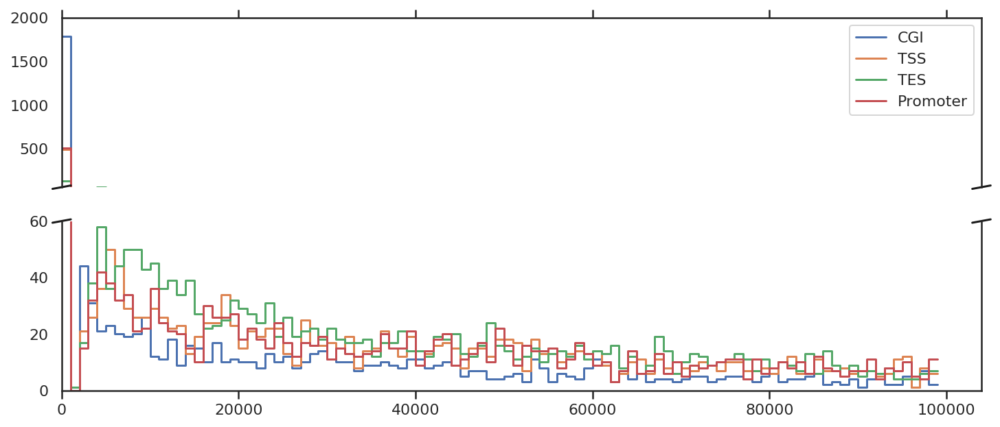

In [35]:
#fig, ax = plt.subplots(1, 1, figsize=(12, 4))
f, (ax, ax2) = plt.subplots(2, 1, sharex=True, figsize=(12, 5))


hist, bin_edges = np.histogram(hotspot_anno_dist.dist_cgi.abs(), density=False, bins=range(0, 100000, 1000))
df = stairs(pd.DataFrame(dict(start=bin_edges[:-1], end=bin_edges[1:], dens=hist)))
ax.plot(df.pos, df.dens, label='CGI')
ax2.plot(df.pos, df.dens, label='CGI')
#ax.fill_between(df.pos, df.dens, alpha=0.1)

hist, bin_edges = np.histogram(hotspot_anno_dist.dist_tss.abs(), density=False, bins=range(0, 100000, 1000))
df = stairs(pd.DataFrame(dict(start=bin_edges[:-1], end=bin_edges[1:], dens=hist)))
ax.plot(df.pos, df.dens, label='TSS')
ax2.plot(df.pos, df.dens, label='TSS')
#ax.fill_between(df.pos, df.dens, alpha=0.1)

hist, bin_edges = np.histogram(hotspot_anno_dist.dist_tes.abs(), density=False, bins=range(0, 100000, 1000))
df = stairs(pd.DataFrame(dict(start=bin_edges[:-1], end=bin_edges[1:], dens=hist)))
ax.plot(df.pos, df.dens, label='TES')
ax2.plot(df.pos, df.dens, label='TES')
#ax.fill_between(df.pos, df.dens, alpha=0.1)

hist, bin_edges = np.histogram(hotspot_anno_dist.dist_promoter.abs(), density=False, bins=range(0, 100000, 1000))
df = stairs(pd.DataFrame(dict(start=bin_edges[:-1], end=bin_edges[1:], dens=hist)))
ax.plot(df.pos, df.dens, label='Promoter')
ax2.plot(df.pos, df.dens, label='Promoter')
#ax.fill_between(df.pos, df.dens, alpha=0.1)

ax.legend()

# # zoom-in / limit the view to different portions of the data
ax.set_ylim(60, 2000)  # outliers only
ax2.set_ylim(0, 60)  # most of the data

# hide the spines between ax and ax2
ax.spines['bottom'].set_visible(False)
ax2.spines['top'].set_visible(False)
ax.xaxis.tick_top()
ax.tick_params(labeltop=False)  # don't put tick labels at the top
ax2.xaxis.tick_bottom()

# This looks pretty good, and was fairly painless, but you can get that
# cut-out diagonal lines look with just a bit more work. The important
# thing to know here is that in axes coordinates, which are always
# between 0-1, spine endpoints are at these locations (0,0), (0,1),
# (1,0), and (1,1).  Thus, we just need to put the diagonals in the
# appropriate corners of each of our axes, and so long as we use the
# right transform and disable clipping.

d = .01  # how big to make the diagonal lines in axes coordinates
# arguments to pass to plot, just so we don't keep repeating them
kwargs = dict(transform=ax.transAxes, color='k', clip_on=False)
ax.plot((-d, +d), (-d, +d), **kwargs)        # top-left diagonal
ax.plot((1 - d, 1 + d), (-d, +d), **kwargs)  # top-right diagonal

kwargs.update(transform=ax2.transAxes)  # switch to the bottom axes
ax2.plot((-d, +d), (1 - d, 1 + d), **kwargs)  # bottom-left diagonal
ax2.plot((1 - d, 1 + d), (1 - d, 1 + d), **kwargs)  # bottom-right diagonal

# What's cool about this is that now if we vary the distance between
# ax and ax2 via f.subplots_adjust(hspace=...) or plt.subplot_tool(),
# the diagonal lines will move accordingly, and stay right at the tips
# of the spines they are 'breaking'

#plt.ylim(0, 200)
plt.xlim(0) ;


## Add distances to CGI, TSS, TES, and promoters

Add to both subst_data and subst_data_incl_cpg

## Pivot to get table with column for each pattern

Rates are means across windows in the same position across hotspots.

In [36]:
rate_table = pd.pivot_table(subst_data,
                            index=['species', 'species_code', 'bin'], columns='pattern', values='rate')
rate_table.columns = rate_table.columns.astype('str')
for a, b in paired_patterns:
    rate_table[f'{a}-{b}'] = rate_table[a] - rate_table[b]
rate_table.head()

pattern                                   rA2C      rT2G      rC2T      rG2A  \
species        species_code bin                                                
Adelie Penguin PYGAD        -40000.0  0.127134  0.130736  0.643765  0.622139   
                            -39000.0  0.131906  0.130103  0.637710  0.653245   
                            -38000.0  0.128374  0.127189  0.607979  0.626926   
                            -37000.0  0.129846  0.134648  0.651986  0.632085   
                            -36000.0  0.133153  0.129590  0.637553  0.665440   

pattern                                   rA2G      rT2C      rA2T      rT2A  \
species        species_code bin                                                
Adelie Penguin PYGAD        -40000.0  0.471809  0.458275  0.123255  0.125359   
                            -39000.0  0.454463  0.464730  0.124945  0.122740   
                            -38000.0  0.450471  0.472136  0.120609  0.123492   
                            -37000.0  0.465178  0.483339  0.131623  0.131217   
                            -36000.0  0.471507  0.474533  0.123190  0.116983   

pattern                                   rC2A      rG2T      rC2G      rG2C  \
species        species_code bin                                                
Adelie Penguin PYGAD        -40000.0  0.195446  0.200138  0.179823  0.186289   
                            -39000.0  0.187863  0.182510  0.171548  0.180287   
                            -38000.0  0.186362  0.182683  0.160011  0.169515   
                            -37000.0  0.174513  0.187521  0.178874  0.178184   
                            -36000.0  0.190599  0.186176  0.182540  0.186873   

pattern                               rT2G-rA2C  rA2G-rT2C  rA2T-rT2A  \
species        species_code bin                                         
Adelie Penguin PYGAD        -40000.0   0.003602   0.013535  -0.002104   
                            -39000.0  -0.001803  -0.010268   0.002205   
                            -38000.0  -0.001185  -0.021665  -0.002883   
                            -37000.0   0.004803  -0.018161   0.000406   
                            -36000.0  -0.003563  -0.003027   0.006207   

pattern                               rG2T-rC2A  rC2G-rG2C  rC2T-rG2A  
species        species_code bin                                        
Adelie Penguin PYGAD        -40000.0   0.004692  -0.006467   0.021626  
                            -39000.0  -0.005353  -0.008740  -0.015535  
                            -38000.0  -0.003679  -0.009504  -0.018947  
                            -37000.0   0.013008   0.000690   0.019901  
                            -36000.0  -0.004423  -0.004333  -0.027888

In [37]:
rate_table_incl_cpg = pd.pivot_table(subst_data_incl_cpg,
                            index=['species', 'species_code', 'bin'], columns='pattern', values='rate')
rate_table_incl_cpg.columns = rate_table_incl_cpg.columns.astype('str')
for a, b in paired_patterns:
    rate_table_incl_cpg[f'{a}-{b}'] = rate_table_incl_cpg[a] - rate_table_incl_cpg[b]
rate_table_incl_cpg.head()

pattern                                   rA2C      rT2G      rC2T      rG2A  \
species        species_code bin                                                
Adelie Penguin PYGAD        -40000.0  0.161619  0.171134  0.771794  0.819704   
                            -39000.0  0.173412  0.169260  0.753410  0.848137   
                            -38000.0  0.166747  0.165965  0.730518  0.830219   
                            -37000.0  0.165139  0.175537  0.786340  0.818705   
                            -36000.0  0.171247  0.170760  0.759557  0.851146   

pattern                                   rA2G      rT2C      rA2T      rT2A  \
species        species_code bin                                                
Adelie Penguin PYGAD        -40000.0  0.721990  0.706027  0.123028  0.125105   
                            -39000.0  0.701268  0.703041  0.124729  0.122503   
                            -38000.0  0.689213  0.734968  0.120441  0.123227   
                            -37000.0  0.709693  0.731417  0.131404  0.131015   
                            -36000.0  0.719103  0.724883  0.122935  0.116764   

pattern                                   rC2A      rG2T      rC2G      rG2C  \
species        species_code bin                                                
Adelie Penguin PYGAD        -40000.0  0.198222  0.188426  0.166403  0.171631   
                            -39000.0  0.191397  0.175115  0.158133  0.167876   
                            -38000.0  0.189260  0.169895  0.148203  0.157573   
                            -37000.0  0.177755  0.178096  0.165072  0.165276   
                            -36000.0  0.196238  0.177473  0.168292  0.173041   

pattern                               rT2G-rA2C  rA2G-rT2C  rA2T-rT2A  \
species        species_code bin                                         
Adelie Penguin PYGAD        -40000.0   0.009514   0.015962  -0.002077   
                            -39000.0  -0.004152  -0.001773   0.002226   
                            -38000.0  -0.000782  -0.045755  -0.002786   
                            -37000.0   0.010398  -0.021724   0.000389   
                            -36000.0  -0.000487  -0.005780   0.006171   

pattern                               rG2T-rC2A  rC2G-rG2C  rC2T-rG2A  
species        species_code bin                                        
Adelie Penguin PYGAD        -40000.0  -0.009796  -0.005228  -0.047910  
                            -39000.0  -0.016282  -0.009742  -0.094727  
                            -38000.0  -0.019365  -0.009370  -0.099701  
                            -37000.0   0.000341  -0.000203  -0.032365  
                            -36000.0  -0.018765  -0.004749  -0.091589

## GC* based on all substitutions, transitions, and transversions

GCflux, is calculated as the AT to GC over GC to AT substitution rate. The equilibrium GC content resulting from this bias, GC*, is calculated as GCflux/(1 + GCflux).


In [38]:
def subst_gc_star(df):
    
    GCflux = (df.rA2G + df.rA2C + df.rT2G + df.rT2C) / \
             (df.rC2A + df.rC2T + df.rG2A + df.rG2T)
    GCstar = GCflux/(1 + GCflux)
    
    GCstar_TV = (df.rA2C + df.rT2G) / (df.rC2A + df.rG2T)
    GCstar_TV = GCstar_TV / (1 + GCstar_TV)

    GCstar_TS = (df.rA2G + df.rT2C) / \
                (df.rC2T + df.rG2A)
    GCstar_TS = GCstar_TS / (1 + GCstar_TS)
    
    return pd.DataFrame(dict(GCstar=GCstar, GCstar_TV=GCstar_TV, GCstar_TS=GCstar_TS))

In [39]:
gc_star_table = rate_table.groupby(['species', 'species_code', 'bin']).apply(subst_gc_star).reset_index()
gc_star_table.head()

,species,species_code,bin,GCstar,GCstar_TV,GCstar_TS
0,Adelie Penguin,PYGAD,-40000.0,0.416908,0.394626,0.423538
1,Adelie Penguin,PYGAD,-39000.0,0.415546,0.414321,0.415896
2,Adelie Penguin,PYGAD,-38000.0,0.423479,0.409157,0.427625
3,Adelie Penguin,PYGAD,-37000.0,0.424261,0.422158,0.424851
4,Adelie Penguin,PYGAD,-36000.0,0.418474,0.410845,0.420643


In [40]:
gc_star_table_incl_cpg = rate_table_incl_cpg.groupby(['species', 'species_code', 'bin']).apply(subst_gc_star).reset_index()
gc_star_table_incl_cpg.head()

,species,species_code,bin,GCstar,GCstar_TV,GCstar_TS
0,Adelie Penguin,PYGAD,-40000.0,0.470931,0.462542,0.472929
1,Adelie Penguin,PYGAD,-39000.0,0.470245,0.483192,0.467191
2,Adelie Penguin,PYGAD,-38000.0,0.477834,0.480890,0.477126
3,Adelie Penguin,PYGAD,-37000.0,0.476072,0.489107,0.473091
4,Adelie Penguin,PYGAD,-36000.0,0.473687,0.477852,0.472711


## GC star across hotspots

In [41]:
gc_star = gc_star_table.melt(id_vars=['species', 'species_code', 'bin'], var_name='variable', value_name='frequency')
gc_star_incl_cpg = gc_star_table_incl_cpg.melt(id_vars=['species', 'species_code', 'bin'], var_name='variable', value_name='frequency')

Excluding CpG sites:

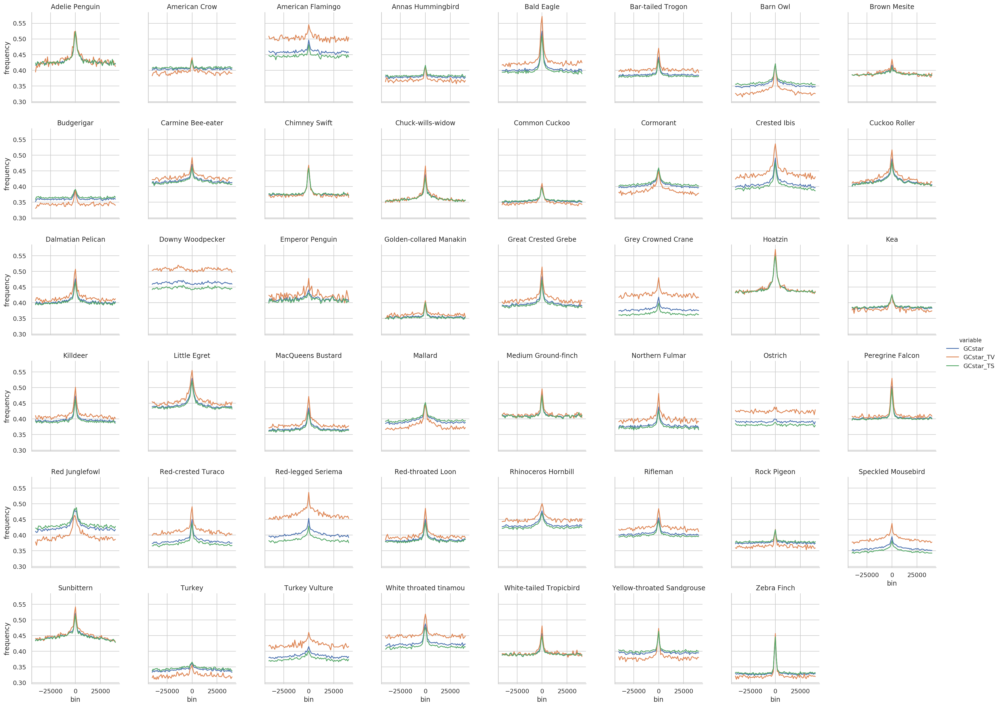

In [104]:
with sns.axes_style('whitegrid'):
    g = sns.FacetGrid(gc_star,
                      col='species', hue='variable',
                      col_wrap=8, sharey=True)#, ylim=(0,1.2))
    g.map(sns.lineplot, 'bin', 'frequency', ci=None).add_legend()
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}') ;

Including CpG sites:

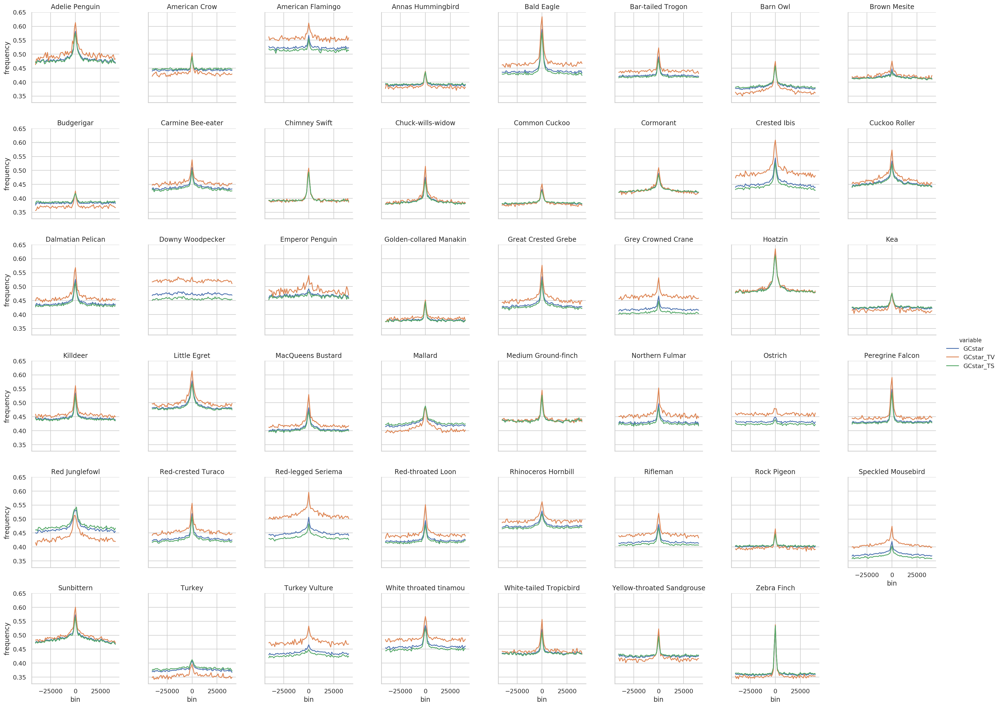

In [105]:
with sns.axes_style('whitegrid'):
    g = sns.FacetGrid(gc_star_incl_cpg,
                      col='species', hue='variable',
                      col_wrap=8, sharey=True)#, ylim=(0,1.2))
    g.map(sns.lineplot, 'bin', 'frequency', ci=None).add_legend()
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}') ;

Three observations:
    
- The magnitude of the GCstar peak varies dramatically between birds. This is in part determined by the long-term species Ne.
- The Downy woodpecker does not have any peak at all. This could be due to miniscule Ne or that it does not use Zebra finch hotspots.

- The background level in flanks of GCstar differs dramatically between transversion and transitions across species. That must be because transversions can be more of less GC-biased than transitions in each species. I.e. it varies accross species how much transitions and transversion contribute to equilibrium GC content.
- The GCstar of transversions at hotspots vs flanks seems to show a slightly higher peak.

Below are larger plots of the two penguins for non-CpG sites:

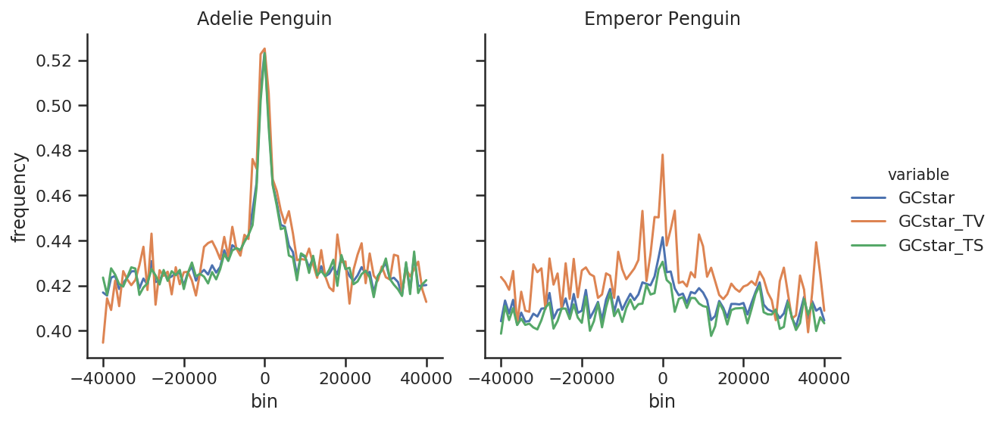

In [44]:
plot_df = gc_star.loc[(gc_star.bin.abs() <= 40000) & gc_star.species_code.isin(['PYGAD', 'APTFO'])]
plot_df.species.cat.remove_unused_categories(inplace=True)

with sns.axes_style('ticks'):
    g = sns.FacetGrid(plot_df,
                      col='species', hue='variable', legend_out=True,
                      sharey=True, height=4, aspect=1)
    g.map(sns.lineplot, 'bin', 'frequency', ci=None).add_legend()
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}') ;

The woodpecker and ostrich show no or almost no GCstar peaks. That could be due to extremely small long-term Ne. However, in "Temporal Dynamics of Avian Populations during Pleistocene Revealed by Whole-Genome Sequences" these two species do not seem to show any inherrent tendency for such small population sizes. Another possible reason could be that the alignment is so poor for these species that the gBGC signal is "swamped" by false positive substitutions. However, if this was the case, then the hotspot which shows the fewest aligned bases should show a peak in all rates - which is does not.

In fact, whereas the alignment quality does not seem to affect estimated rates, it does seem to be natural consequence of a higher recombination rate: more recombination will produce more structural variation that is harder to align. We analyze the dependency on alignmnet quality below.

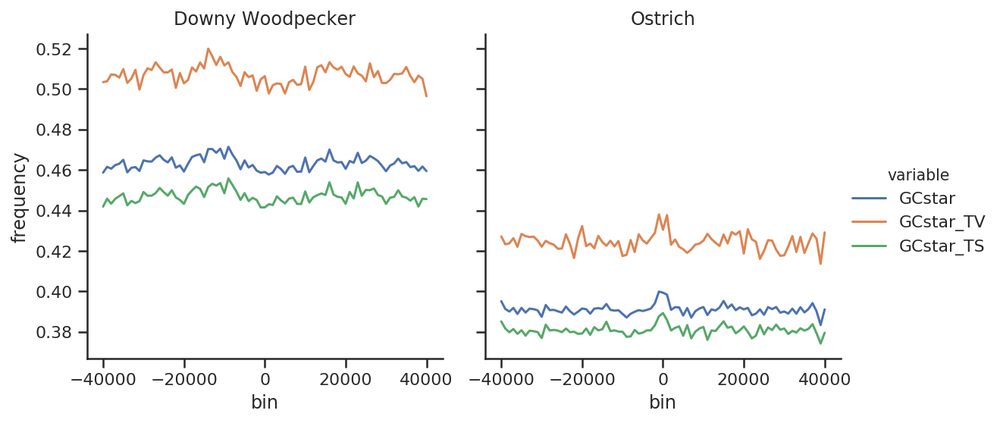

In [45]:
plot_df = gc_star.loc[(gc_star.bin.abs() <= 40000) & gc_star.species_code.isin(['PICPU', 'STRCA'])]
plot_df.species.cat.remove_unused_categories(inplace=True)

with sns.axes_style('ticks'):
    g = sns.FacetGrid(plot_df,
                      col='species', hue='variable', legend_out=True,
                      sharey=True, height=4, aspect=1)
    g.map(sns.lineplot, 'bin', 'frequency', ci=None).add_legend()
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}') ;

## GC star vs GC content in hotspots and flanks

Compute GC content:

In [46]:
gc_counts = hotspot_data.nG + hotspot_data.ng + hotspot_data.nC + hotspot_data.nc
at_counts = hotspot_data.nA + hotspot_data.nT
gc_contents = gc_counts / (gc_counts + at_counts)
gc_contents.index = pd.MultiIndex.from_frame(hotspot_data[['species', 'species_code', 'bin']])
gc_contents.head()

species          species_code  bin
Northern Fulmar  FULGL         0.0    0.528571
                               0.0    0.452202
                               0.0    0.481550
                               0.0    0.500455
                               0.0    0.656794
dtype: float64

In [47]:
mean_species_gc_contents = gc_contents.to_frame(name='GCcontent').groupby('species').mean()

Compute GC star in hotspots and flanks:

In [48]:
def get_gc_star_in_flanks(df):
    return df.loc[(df.bin.abs() < 40000) & (df.bin.abs() >= 10000)].groupby(['species', 'variable']).frequency.mean()

def get_gc_star_at_center(df):
    return df.loc[df.bin == 0].groupby(['species', 'variable']).frequency.mean()


flanks = get_gc_star_in_flanks(gc_star).unstack()
center = get_gc_star_at_center(gc_star).unstack()

Plot GC star vs. GC content. The dashed line is the diagonal. So flanks seem to be descreasing in GC content whereas centers are increasing.

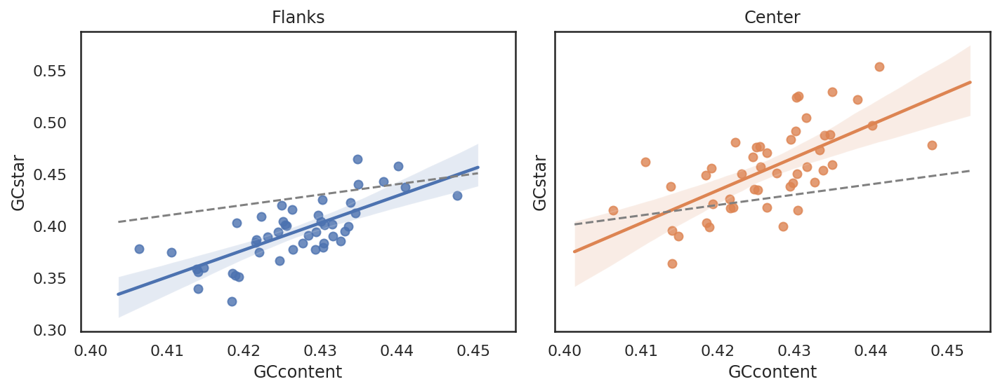

In [49]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), sharex=True, sharey=True)

plot_df = mean_species_gc_contents.join(flanks)
sns.regplot(plot_df.GCcontent, plot_df.GCstar, ax=ax1)
ax1.set_title('Flanks')
abline(1, 0, ax=ax1)

plot_df = mean_species_gc_contents.join(center)
sns.regplot(plot_df.GCcontent, plot_df.GCstar, ax=ax2)
ax2.set_title('Center')
abline(1, 0, ax=ax2)
 
plt.tight_layout()

## Calculate B

Compute population scaled gBGC selection coeficient following box 1 in C. F. Mugal et al.: GC-biased gene conversion links the recombination landscape and demography to genomic base composition.

$b=\frac{\ln\big(\frac{1-{GC}^*}{GC^* R}\big)}{2(1-2N)\ln(e)} = \frac{\ln\big(\frac{1-{GC}^*}{{GC}^* R}\big)}{2(1-2N)}$

$B \approx - \frac{\ln\big(\frac{1-{GC}^*}{{GC}^* R}\big)}{4}$


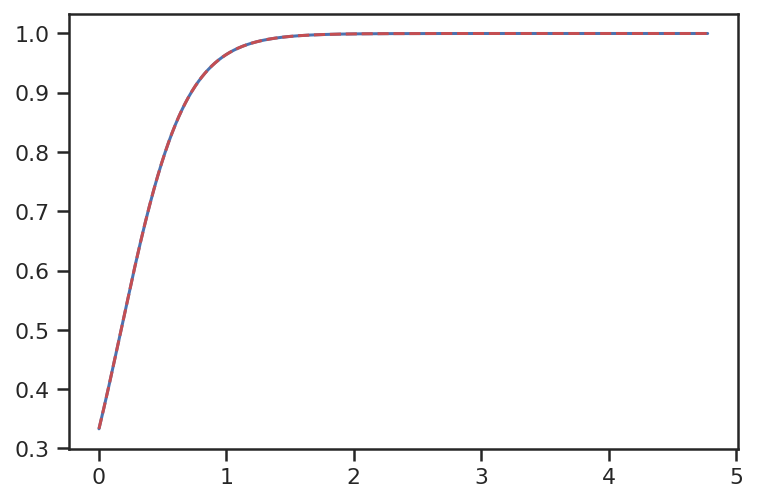

In [50]:
from math import log
import numpy as np

def b(GCstar, N, R):
    return log((1-GCstar) / (GCstar * R)) / (2*(1-2*N))

def B(GCstar, R):
    return - log((1-GCstar) / (GCstar * R)) / 4

# R = 1.5
# with sns.axes_style('ticks'):
#     x = np.linspace(0.4, 0.99999999, 10000)
#     plt.plot([b(y, 10000, R=R) for y in x], x, 'b-')
#     plt.plot([B(y, R=R)/10000 for y in x], x, 'r--')

#     plt.plot([b(y, 100000, R=R) for y in x], x, 'b-')
#     plt.plot([B(y, R=R)/100000 for y in x], x, 'r--')
#     plt.xlim(0, 5e-5)

with sns.axes_style('ticks'):
    x = np.linspace(0.333, 0.99999999, 100000)
    plt.plot([b(y, R=2, N=10000)*10000 for y in x], x, 'b-')
    plt.plot([B(y, R=2) for y in x], x, 'r--')

To compute B, we need R, the relative mutation rate from GC to AT of 2.

**Approach 1:** Assume a relative mutation rate from GC to AT of 2 (to allow a GC content in flanks as low as 1/3)

In [51]:
mean_species_gc_contents = gc_contents.to_frame(name='GCcontent').groupby('species').mean()

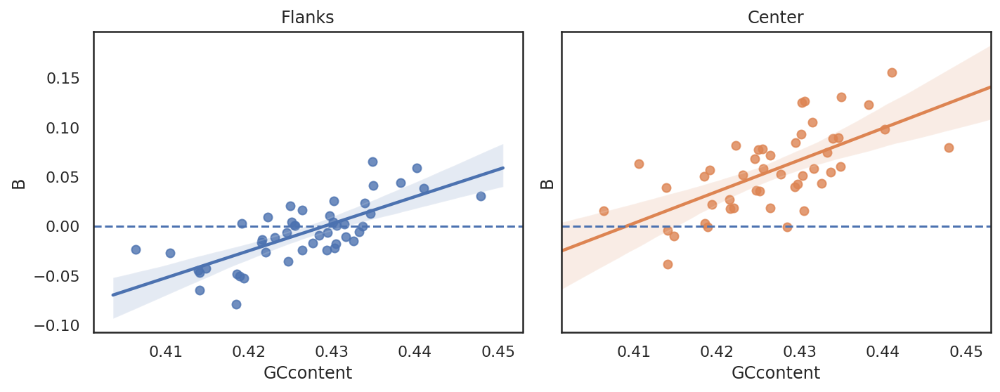

In [52]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), sharex=True, sharey=True)

# assume an R: relative mutation rate from GC to AT
R = 1.5

plot_df_flanks = mean_species_gc_contents.join(flanks)
sns.regplot(plot_df_flanks.GCcontent, [B(x, R=R) for x in plot_df_flanks.GCstar], ax=ax1)
ax1.set_ylabel('B')
ax1.set_title('Flanks')
ax1.axhline(0, linestyle='--')

plot_df_center = mean_species_gc_contents.join(center)
sns.regplot(plot_df_center.GCcontent, [B(x, R=R) for x in plot_df_center.GCstar], ax=ax2)
ax2.set_ylabel('B')
ax2.set_title('Center')
ax2.axhline(0, linestyle='--')
 
plt.tight_layout()

**Approach 2:** Assume a that flanks in each species are neutral and reflect R only:

${GC}^* = R / (1+R) \Rightarrow R = 1/{GC}^* - 1$




In [1]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 4))

R_values = [1/x-1 for x in plot_df_flanks.GCstar]
sns.distplot(R_values, ax=ax1)
ax1.set_title('R')
ax2.axvline(np.mean(R_values), linestyle='dashed')

B_values = [B(x, y) for (x, y) in zip(plot_df_center.GCstar, R_values)]
sns.distplot(B_values, ax=ax2)
ax2.set_title('B')
ax2.axvline(np.mean(B_values), linestyle='dashed')

sns.regplot(plot_df_flanks.GCcontent, B_values, ax=ax3)
ax3.set_ylabel('B')

plt.tight_layout()

NameError: name 'plt' is not defined

## GC star at hotspot relative to flanks

In [54]:
def compute_gc_star_ratios(df):
    flank = get_gc_star_in_flanks(df)
    center = get_gc_star_at_center(df)
    ratios = (center / flank).reset_index().rename(columns={'frequency': 'ratio'})
    ratios_df = ratios.pivot(index='species', columns='variable', values='ratio').rename(columns=str).reset_index()
    ratios = ratios_df.melt(id_vars=['species'], var_name='variable', value_name='ratio')
    return ratios

gc_star_ratios = compute_gc_star_ratios(gc_star)
gc_star_ratios_incl_cpg = compute_gc_star_ratios(gc_star_incl_cpg)

gc_star_ratios.head()

,species,variable,ratio
0,Adelie Penguin,GCstar,1.232254
1,American Crow,GCstar,1.075160
2,American Flamingo,GCstar,1.085422
3,Annas Hummingbird,GCstar,1.098620
4,Bald Eagle,GCstar,1.310675


In [55]:
gc_star_ratio_table = gc_star_ratios.pivot(index='species', columns='variable', values='ratio')
gc_star_ratio_table_incl_cpg = gc_star_ratios_incl_cpg.pivot(index='species', columns='variable', values='ratio')

gc_star_ratio_table.head()

variable,GCstar,GCstar_TS,GCstar_TV
species,,,
Adelie Penguin,1.232254,1.232496,1.231287
American Crow,1.075160,1.058709,1.125368
American Flamingo,1.085422,1.083857,1.089593
Annas Hummingbird,1.098620,1.088911,1.124619
Bald Eagle,1.310675,1.293433,1.357559


Difference between GCstar computed form transitions and transversions

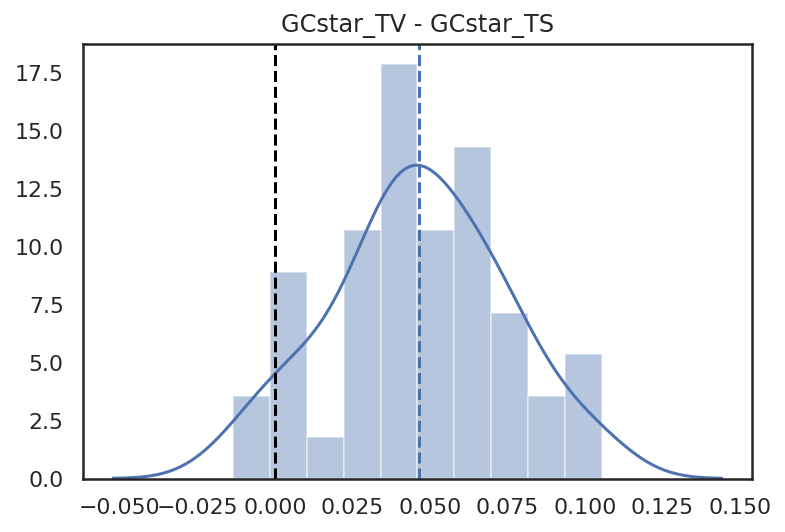

In [56]:
sns.distplot(gc_star_ratio_table.GCstar_TV - gc_star_ratio_table.GCstar_TS, bins=10)
plt.axvline(x=(gc_star_ratio_table.GCstar_TV - gc_star_ratio_table.GCstar_TS).mean(), linestyle='dashed') ;
plt.axvline(x=0, linestyle='dashed', color='black') 
plt.title('GCstar_TV - GCstar_TS') ;

Excluding CpG sites:

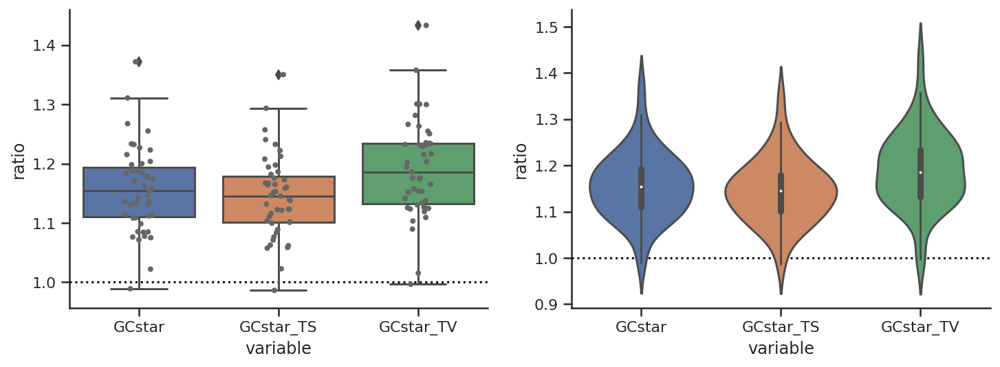

In [57]:
with sns.axes_style('ticks'):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    
    sns.stripplot(x="variable", y="ratio", jitter=True, data=gc_star_ratios, 
                  color='#666666', ax=ax1, size=4)
    sns.boxplot(x="variable", y="ratio", data=gc_star_ratios, ax=ax1)
    ax1.axhline(y=1, linestyle='dotted', color='black', zorder=0)

    sns.violinplot(x="variable", y="ratio", data=gc_star_ratios, ax=ax2)
    ax2.axhline(y=1, linestyle='dotted', color='black', zorder=0)

    sns.despine()

Including CpG sites:

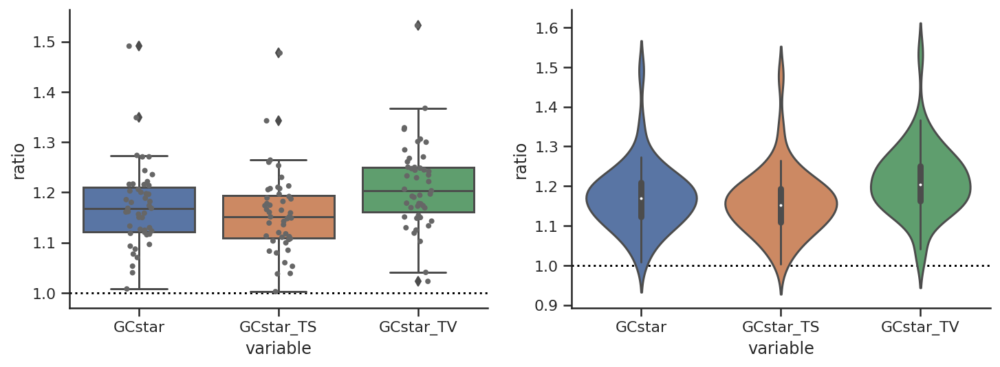

In [58]:
with sns.axes_style('ticks'):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    
    sns.stripplot(x="variable", y="ratio", jitter=True, data=gc_star_ratios_incl_cpg, 
                  color='#666666', ax=ax1, size=4)
    sns.boxplot(x="variable", y="ratio", data=gc_star_ratios_incl_cpg, ax=ax1)
    ax1.axhline(y=1, linestyle='dotted', color='black', zorder=0)

    sns.violinplot(x="variable", y="ratio", data=gc_star_ratios_incl_cpg, ax=ax2)
    ax2.axhline(y=1, linestyle='dotted', color='black', zorder=0)

    sns.despine()

Significance of diference with paired t-test:

Shapiro-Wilk test for normality (second val is p) (0.9899038672447205, 0.9540890455245972)


Ttest_relResult(statistic=-11.403284056261075, pvalue=5.3147532837096555e-15)

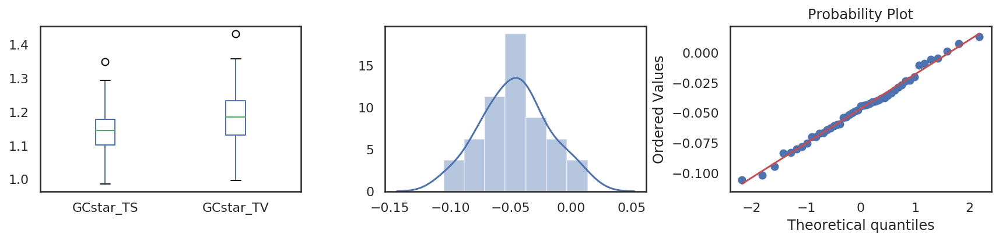

In [59]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 3))

gc_star_ratio_table[['GCstar_TS', 'GCstar_TV']].plot(kind='box', ax=ax1) ;

diff = gc_star_ratio_table['GCstar_TS'] - gc_star_ratio_table['GCstar_TV']
sns.distplot(diff, ax=ax2) ;

stats.probplot(diff, plot=ax3)

plt.tight_layout()

print("Shapiro-Wilk test for normality (second val is p)", stats.shapiro(diff))

stats.ttest_rel(gc_star_ratio_table['GCstar_TS'], gc_star_ratio_table['GCstar_TV'])

Same but including CpG sites:

Shapiro-Wilk test for normality (second val is p) (0.9899038672447205, 0.9540890455245972)


Ttest_relResult(statistic=-11.403284056261075, pvalue=5.3147532837096555e-15)

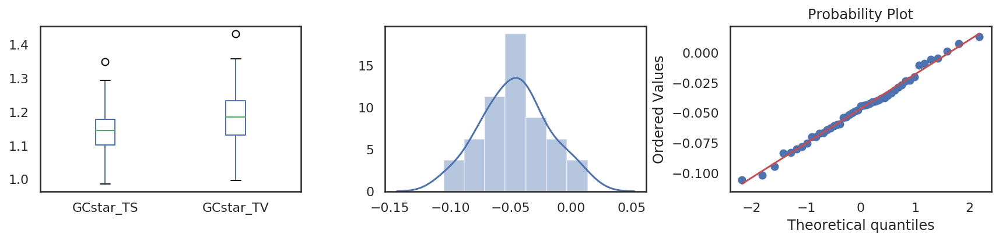

In [60]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 3))

gc_star_ratio_table[['GCstar_TS', 'GCstar_TV']].plot(kind='box', ax=ax1) ;

diff = gc_star_ratio_table['GCstar_TS'] - gc_star_ratio_table['GCstar_TV']
sns.distplot(diff, ax=ax2) ;

stats.probplot(diff, plot=ax3)

plt.tight_layout()

print("Shapiro-Wilk test for normality (second val is p)", stats.shapiro(diff))

stats.ttest_rel(gc_star_ratio_table['GCstar_TS'], gc_star_ratio_table['GCstar_TV'])

## GC star ratio hotspots overlapping and not overlapping CGIs

In [61]:
df = (subst_data
      .merge(hotspot_anno_dist[['hotspot_center', 'dist_cgi']], 
             on='hotspot_center')
      .assign(cgi_overlapping=lambda df: df.dist_cgi==0)
     )

table = pd.pivot_table(df, index=['species', 'species_code', 'bin', 'cgi_overlapping'], 
                    columns='pattern', values='rate')

gc_star_rel_cgi_table = (table
                                .groupby(['species', 'species_code', 'bin', 'cgi_overlapping'])
                                .apply(subst_gc_star)
                                .reset_index()
                               )

gc_star_rel_cgi = gc_star_rel_cgi_table.melt(id_vars=['species', 'species_code', 'cgi_overlapping', 'bin'], var_name='variable', value_name='frequency')

def compute_gc_star_ratios(df):
    flank = df.loc[(df.bin.abs() < 40000) & (df.bin.abs() >= 10000)].groupby(['species', 'cgi_overlapping', 'variable']).frequency.mean()
    center = df.loc[df.bin == 0].groupby(['species', 'cgi_overlapping', 'variable']).frequency.mean()
    ratios = (center / flank).reset_index().rename(columns={'frequency': 'ratio'})
    ratios_df = pd.pivot_table(ratios, index=['species', 'cgi_overlapping'], columns='variable', values='ratio').rename(columns=str).reset_index()
    ratios = ratios_df.melt(id_vars=['species', 'cgi_overlapping'], var_name='variable', value_name='ratio')
    return ratios

gc_star_ratios_rel_cgi = compute_gc_star_ratios(gc_star_rel_cgi)

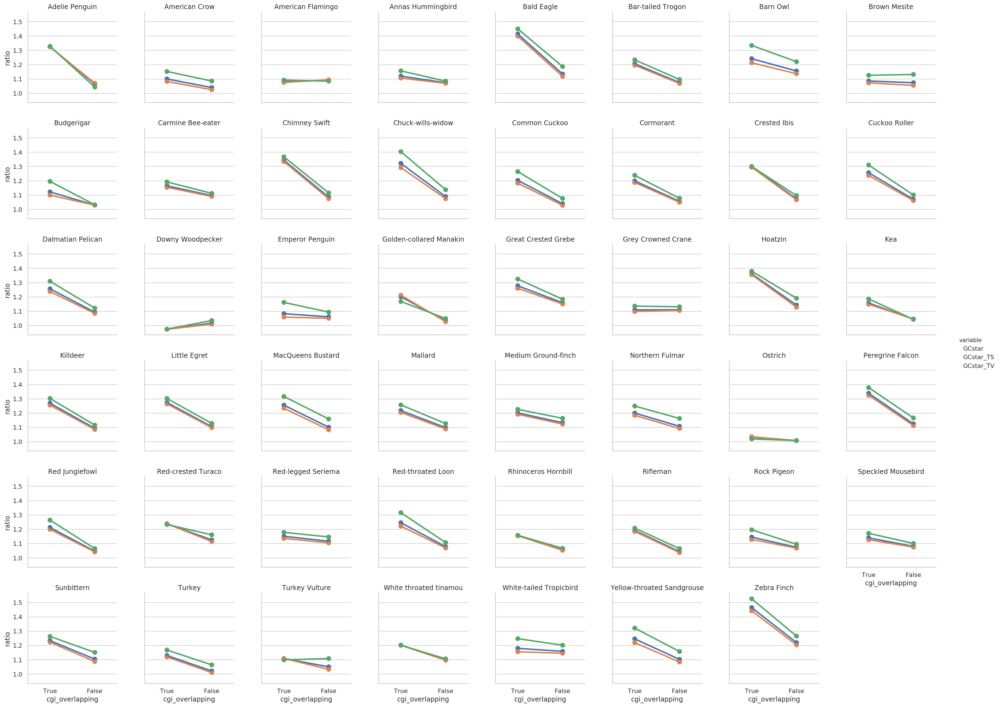

In [106]:
with sns.axes_style('whitegrid'):
    g = sns.FacetGrid(gc_star_ratios_rel_cgi,
                      col='species', hue='variable',
                      col_wrap=8, sharey=True)
    g.map(sns.pointplot, 'cgi_overlapping', 'ratio',
          order=[True, False],
          ci=None).add_legend()
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}') ;

Looking at Zebra Finch, it seems that CGI hotspots are stronger. The other species show the same pattern, except for the ones that where not hotspots overlap. So it is hard to distiguish lower heat of non-CGI hotspots and lower hotspot sharing across species.

## Substitution rates around hotspots

The two penguins:

In [63]:
plot_df = subst_data.loc[subst_data.species_code.isin(['PYGAD', 'APTFO'])].copy()
plot_df.species.cat.remove_unused_categories(inplace=True)
plot_df.loc[plot_df.pattern.isin(transitions), 'type'] = 'Transition'
plot_df.loc[~plot_df.pattern.isin(transitions), 'type'] = 'Transversion'
plot_df.loc[:, 'type'] = pd.Categorical(plot_df.type.values, categories=['Transition', 'Transversion'], ordered=True)

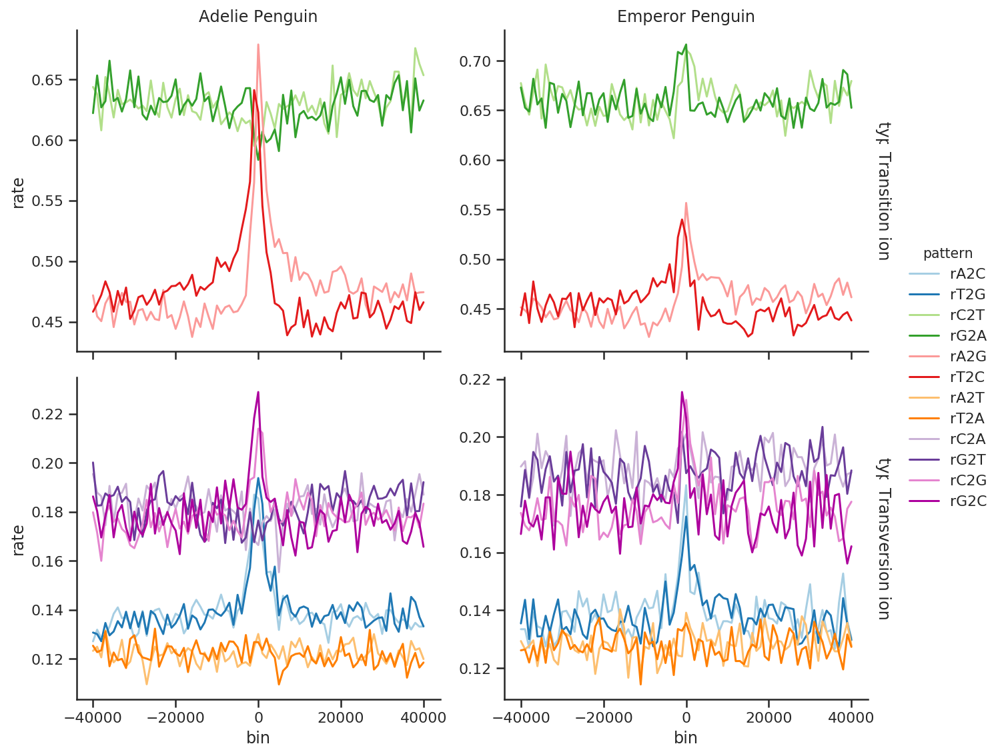

In [64]:
with sns.axes_style('ticks'):
    with sns.color_palette(Paired):
        g = sns.FacetGrid(plot_df,
                          col='species', row='type', hue='pattern',
                          legend_out=True, margin_titles=True,
                          sharey=False, height=4, aspect=1.2)
        g.map(sns.lineplot, 'bin', 'rate', ci=None).add_legend()
        g.set_titles(row_template = '{row_name}', col_template = '{col_name}')

Same but requiring that the number of aligned bases is at least 900

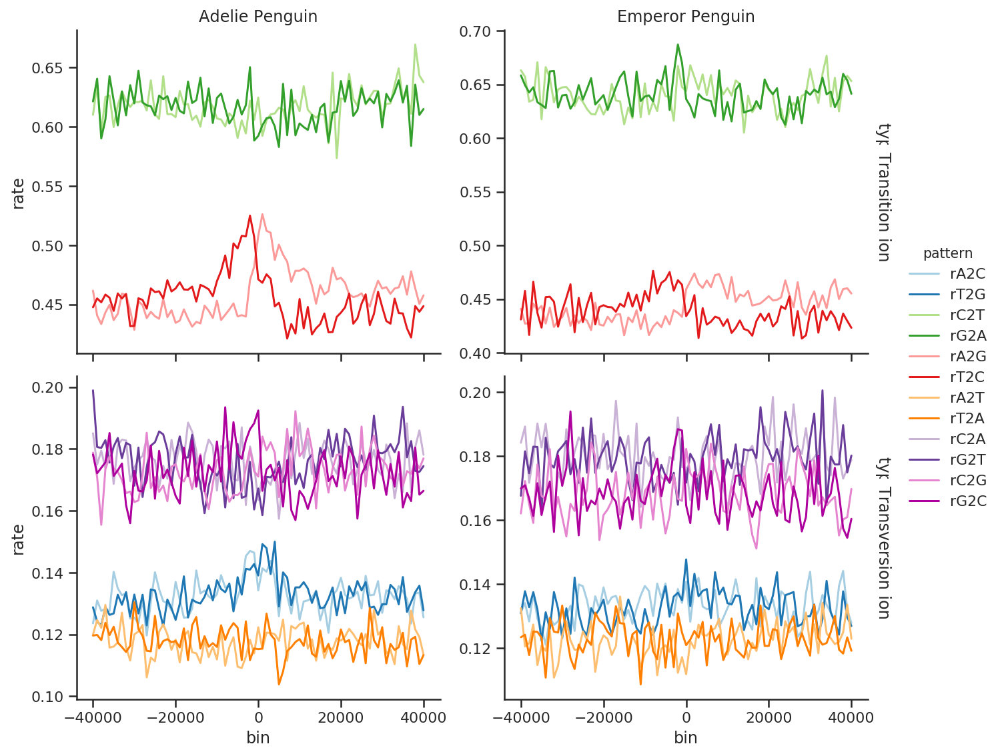

In [65]:
with sns.axes_style('ticks'):
    with sns.color_palette(Paired):
        g = sns.FacetGrid(plot_df.loc[plot_df.nr_aligned >= 900],
                          col='species', row='type', hue='pattern',
                          legend_out=True, margin_titles=True,
                          sharey=False, height=4, aspect=1.2)
        g.map(sns.lineplot, 'bin', 'rate', ci=None).add_legend()
        g.set_titles(row_template = '{row_name}', col_template = '{col_name}')

Note the difference in y-axis in the plots above. It seems to be the windows with fewer than 900 bases aligned (300-900) are the ones responsible for the large peak right at the center. This is probably a biological signal: windows with higher recombination have more structural variation. What is more important is that the AT conservative substututions do not seem to be affected. This suggests that the lower number of aligned bases in some windows is not due to misalignment as this would inflate all the rates at the hotspot center where there are fewest aligned bases.

Plot all rates for each species:

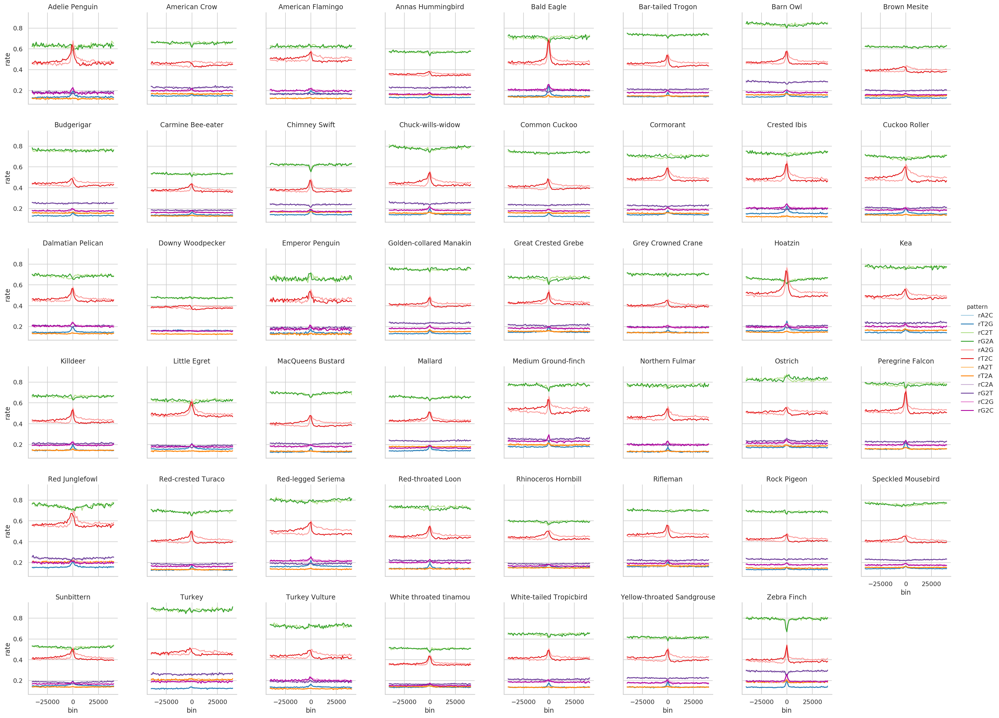

In [107]:
with sns.axes_style('whitegrid'):
    with sns.color_palette(Paired):
        g = sns.FacetGrid(subst_data,
                          col='species', hue='pattern',
                          col_wrap=8, sharey=True)#, ylim=(0,1.2))
        g.map(sns.lineplot, 'bin', 'rate', ci=None).add_legend()
        g.set_titles(row_template = '{row_name}', col_template = '{col_name}') ;

## Substitution rates at center of hotspots relative to flanks

In [67]:
subst_flank = subst_data.loc[(40000 > subst_data.bin.abs()) & (subst_data.bin.abs() >= 10000)].groupby(['species', 'pattern']).rate.mean()
subst_center = subst_data.loc[subst_data.bin == 0].groupby(['species', 'pattern']).rate.mean()
subst_ratios = (subst_center / subst_flank).reset_index().rename(columns={'rate': 'ratio'})
df = subst_ratios.pivot(index='species', columns='pattern', values='ratio').rename(columns=str).reset_index()
plot_df = df.melt(id_vars=['species'], var_name='pattern', value_name='ratio')
plot_df.head()

,species,pattern,ratio
0,Adelie Penguin,rA2C,1.360904
1,American Crow,rA2C,1.118783
2,American Flamingo,rA2C,1.137598
3,Annas Hummingbird,rA2C,1.158978
4,Bald Eagle,rA2C,1.649679


In [68]:
order=['rA2C', 'rT2G', 'rA2G', 'rT2C', 'rC2G', 'rG2C', 'rA2T', 'rT2A', 'rC2T', 'rG2A', 'rC2A', 'rG2T']

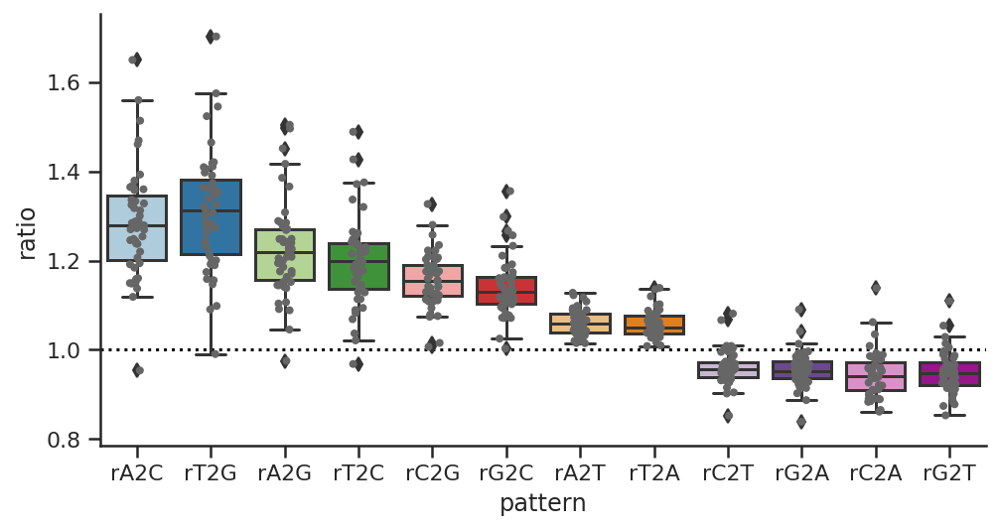

In [69]:
with sns.color_palette(Paired):
    with sns.axes_style('ticks'):
        fig, ax = plt.subplots(figsize=(8, 4))
        sns.stripplot(x="pattern", y="ratio", jitter=True, data=plot_df, 
                      color='#666666', ax=ax, size=4, order=order)
        sns.boxplot(x="pattern", y="ratio", data=plot_df, ax=ax, order=order)
        sns.despine()
        plt.axhline(y=1, linestyle='dotted', color='black', zorder=0)

It looks like the GC conservative substitutionr rates are symmetric, but that there is a slight skew in the non-conservative ones. E.g. rA2C < rT2G.

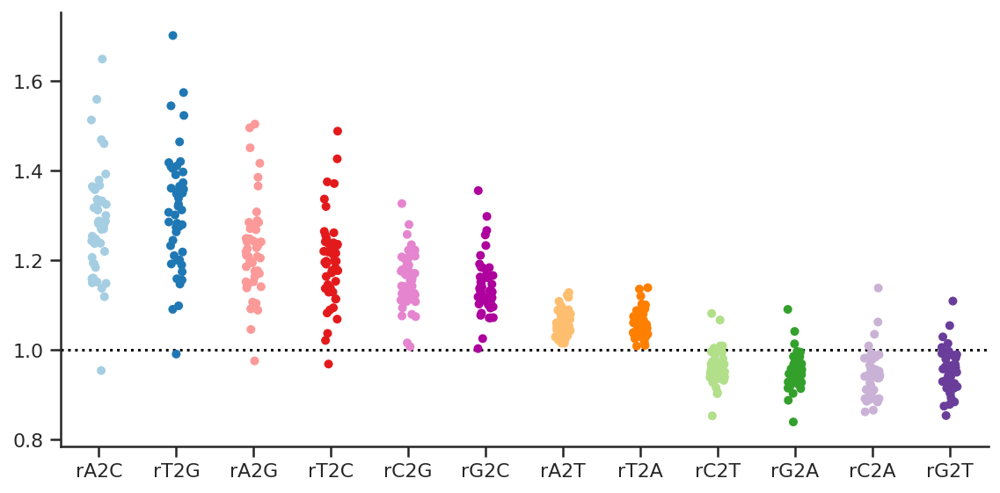

In [70]:
with sns.color_palette(Paired):
    with sns.axes_style('ticks'):
        g = sns.catplot(x="pattern", y="ratio", #col='species',# col_wrap=5, 
                      jitter=True, data=plot_df, hue='pattern',
                      height=4, aspect=2,
                      order=order
                   )
        g.map(plt.axhline, y=1, linestyle='dotted', color='black', zorder=0)

Individual species with error bars:

In [71]:
indiv_subst_flank = subst_data.loc[(40000 > subst_data.bin.abs()) & (subst_data.bin.abs() >= 10000)].groupby(['species', 'pattern', 'hotspot_center']).rate.mean()
indiv_subst_flank.name = 'rate_flank'
indiv_subst_center = subst_data.loc[subst_data.bin == 0].groupby(['species', 'pattern', 'hotspot_center']).rate.mean()
indiv_subst_center.name = 'rate_center'

In [72]:
len(set([x[2] for x in indiv_subst_flank.index.values])), len(set([x[2] for x in indiv_subst_center.index.values]))


(2846, 2641)

In [73]:
# df = pd.concat([indiv_subst_flank, indiv_subst_center], axis=1).reset_index()
# df.head()

In [74]:
# def mean_ratio(df):
#     return (df.rate_center.mean() / df.rate_flank.mean()).mean()

# def std_ratio(df):
#     bootstraps = list()
#     for i in range(1000):
#         sample_df = df.sample(frac=1, replace=True)
#         bootstraps.append(sample_df.rate_center.mean() / sample_df.rate_flank.mean())
#     bootstraps = pd.Series(bootstraps)
# #     return pd.DataFrame(dict(mean=[bootstraps.mean()], std=[bootstraps.std()]))
#     return bootstraps.std()

In [75]:
indiv_subst_ratios = (indiv_subst_center / indiv_subst_flank).reset_index().rename(columns={0: 'ratio'})
# ratios = (center / flank).reset_index().rename(columns={'rate': 'ratio'})#.dropna()
indiv_subst_ratios.head()

,species,pattern,hotspot_center,ratio
0,Adelie Penguin,rA2C,86463,0.000000
1,Adelie Penguin,rA2C,121019,0.000000
2,Adelie Penguin,rA2C,147199,2.796296
3,Adelie Penguin,rA2C,204503,0.000000
4,Adelie Penguin,rA2C,291046,3.850549


In [108]:
indiv_subst_ratios.loc[indiv_subst_ratios.ratio.isin([np.inf, -np.inf])].hotspot_center.unique()

array([70868289, 27679149,  6716002, 80505680,  6692512,  7151518,
       15920042,   147199,  9946044, 41677518, 17506039, 94812539,
       76671505, 79489216, 24081954, 21131636, 61499505])

In [77]:
plot_df = indiv_subst_ratios.replace([np.inf, -np.inf], np.nan).dropna()

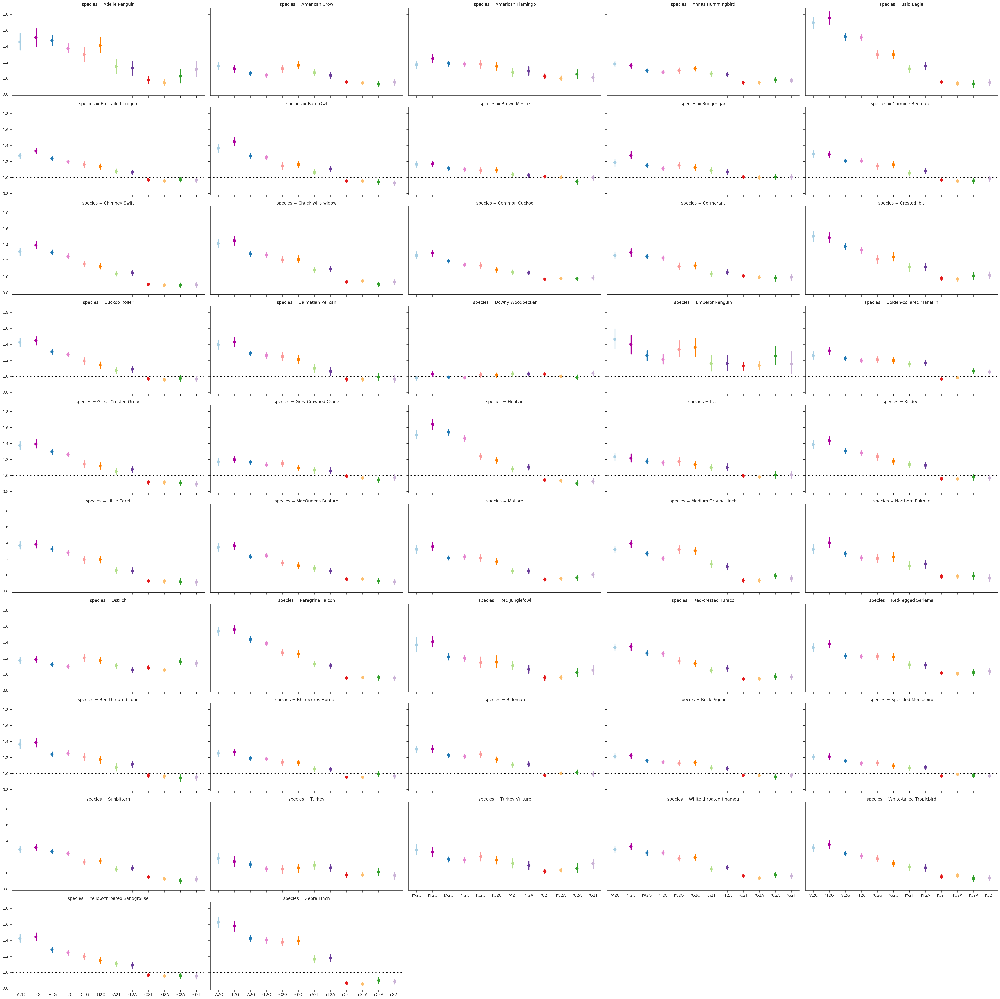

In [78]:
with sns.color_palette(Paired):
    with sns.axes_style('ticks'):
        g = sns.catplot(x="pattern", y="ratio", col='species', col_wrap=5, 
                        kind='point', join=False,
                        data=plot_df,
                        hue='pattern', s=15,
                        height=4, aspect=2,
                        order=order
                   )
        g.map(plt.axhline, y=1, linestyle='dotted', color='black', zorder=0)
        
        
#        plt.errorbar(x, y + 3, yerr=yerr, label='both limits (default)')


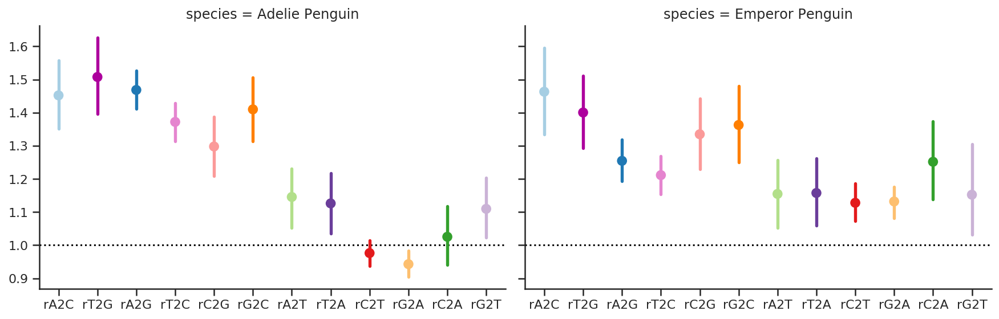

In [79]:
#plot_df_subset = plot_df.loc[plot_df.species_code.isin(['APTFO', 'PYGAD'])]
plot_df_subset = plot_df.loc[plot_df.species.isin(['Adelie Penguin', 'Emperor Penguin'])]
#plot_df_subset.species.cat.remove_unused_categories(inplace=True)

#plot_df_subset = plot_df_subset.loc[~plot_df_subset.ratio.isnull()]

with sns.color_palette(Paired):
    with sns.axes_style('ticks'):
        g = sns.catplot(x="pattern", y="ratio", col='species', col_wrap=5, 
                      jitter=True, data=plot_df_subset,
                      hue='pattern', s=7, kind='point',
                      height=4, aspect=1.5,
                      order=order
                   )
        g.map(plt.axhline, y=1, linestyle='dotted', color='black', zorder=0)

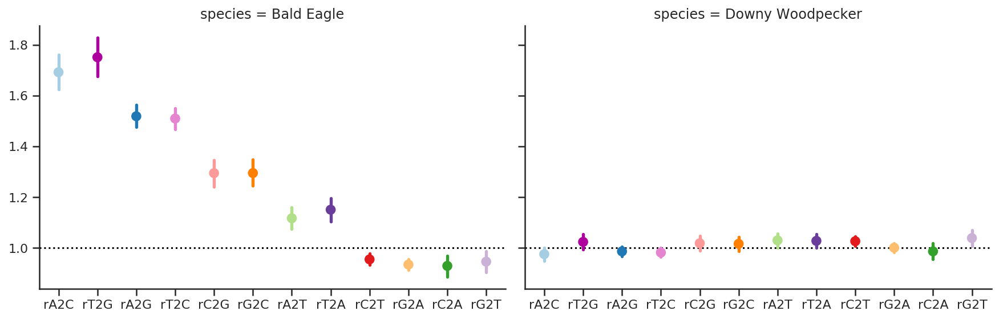

In [80]:
#plot_df_subset = plot_df.loc[plot_df.species_code.isin(['APTFO', 'PYGAD'])]
plot_df_subset = plot_df.loc[plot_df.species.isin(['Downy Woodpecker', 'Bald Eagle'])]
#plot_df_subset.species.cat.remove_unused_categories(inplace=True)

#plot_df_subset = plot_df_subset.loc[~plot_df_subset.ratio.isnull()]

with sns.color_palette(Paired):
    with sns.axes_style('ticks'):
        g = sns.catplot(x="pattern", y="ratio", col='species', col_wrap=5, 
                      jitter=True, data=plot_df_subset,
                      hue='pattern', s=7, kind='point',
                      height=4, aspect=1.5,
                      order=order
                   )
        g.map(plt.axhline, y=1, linestyle='dotted', color='black', zorder=0)

In [81]:
plot_df = pd.DataFrame()
for a, b in paired_patterns:
    plot_df[f'{a}+{b}'] = (df[a] + df[b]) / 2
plot_df.head()
plot_df = plot_df.melt(var_name='pattern', value_name='ratio')

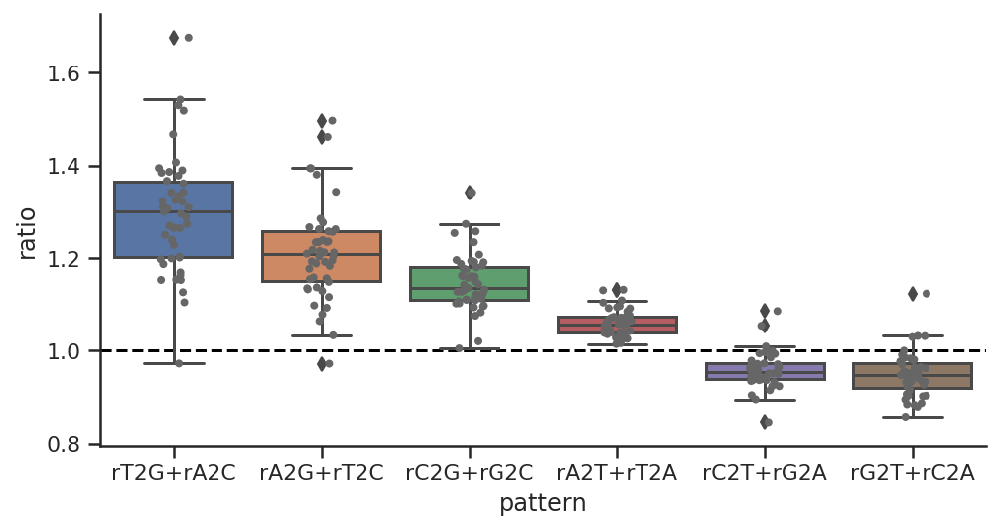

In [82]:
order=['rT2G+rA2C', 'rA2G+rT2C', 'rC2G+rG2C', 'rA2T+rT2A', 'rC2T+rG2A', 'rG2T+rC2A']
with sns.axes_style('ticks'):
    fig, ax = plt.subplots(figsize=(8, 4))
    sns.stripplot(x="pattern", y="ratio", jitter=True, data=plot_df, 
                  color='#666666', ax=ax, size=4, order=order)
    sns.boxplot(x="pattern", y="ratio", data=plot_df, ax=ax, order=order)
    sns.despine()
    plt.axhline(y=1, linestyle='dashed', color='black', zorder=0)

## Strand bias in substitution rates

For now just the rA2G and rT2C rates divided by their sum.

In [83]:
plot_df = rate_table[['rA2G', 'rT2C']].assign(rA2G_norm=lambda df: df.rA2G/(df.rA2G + df.rT2C),
                                              rT2C_norm=lambda df: df.rT2C/(df.rA2G + df.rT2C))
plot_df = plot_df[['rA2G_norm', 'rT2C_norm']].reset_index().melt(id_vars=['species', 'species_code', 'bin'])

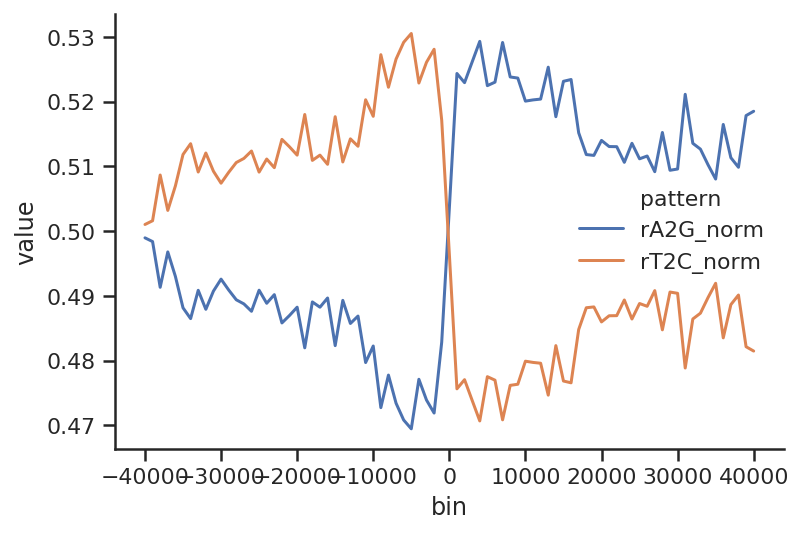

In [84]:
with sns.axes_style('ticks'):
    ax = sns.lineplot('bin', 'value', hue='pattern', ci=None, data=plot_df.loc[plot_df.species == 'Zebra Finch'])
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    sns.despine()
#     plt.axvline(0, linestyle='dashed')
    plt.legend(frameon=False)

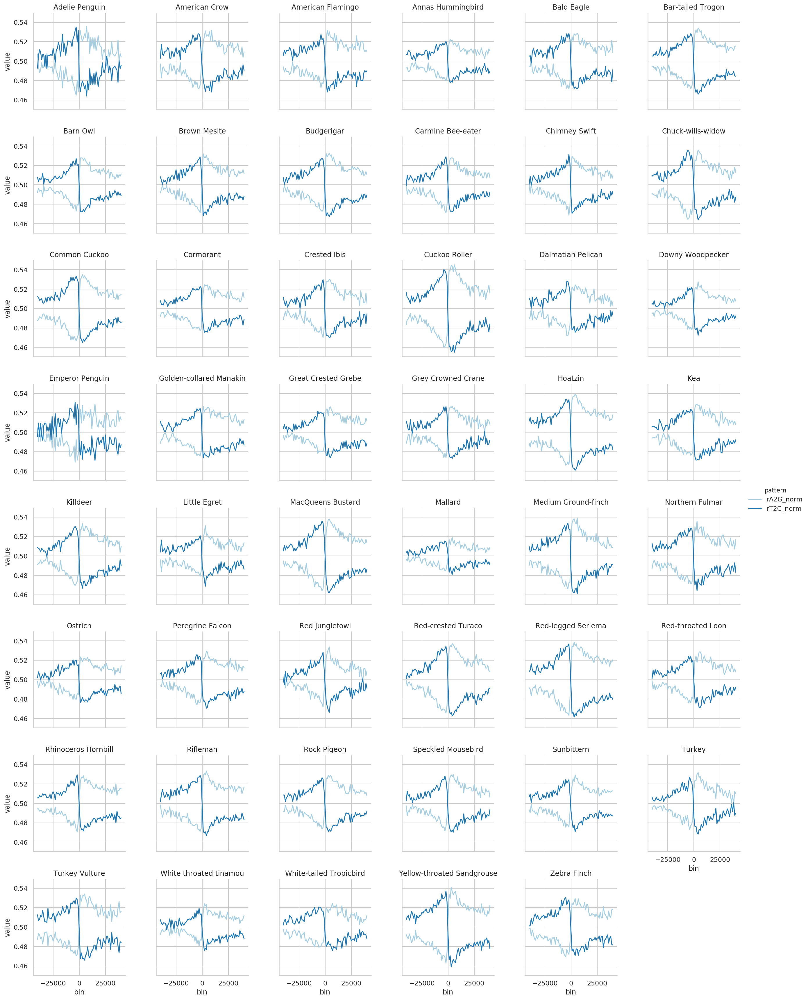

In [85]:
with sns.axes_style('whitegrid'):
    with sns.color_palette("Paired"):
        g = sns.FacetGrid(plot_df,
                          col='species', hue='pattern',
                          col_wrap=6, sharey=True)
        g = g.map(sns.lineplot, 'bin', 'value', ci=None).add_legend()
        g.set_titles(row_template = '{row_name}', col_template = '{col_name}') ;

## S-jumps

In the plots above, the `rA2G` and `rT2C` are symmetric on each side. So it is maybe not the most sensible way to plot it. Here we plot their difference instead:


In [138]:
plot_df = (rate_table[['rT2G-rA2C', 'rA2G-rT2C', 'rA2T-rT2A',
                       'rG2T-rC2A', 'rC2G-rG2C', 'rC2T-rG2A']]
           .reset_index()
           .melt(id_vars=['species', 'species_code', 'bin'], value_name='rate')
          )

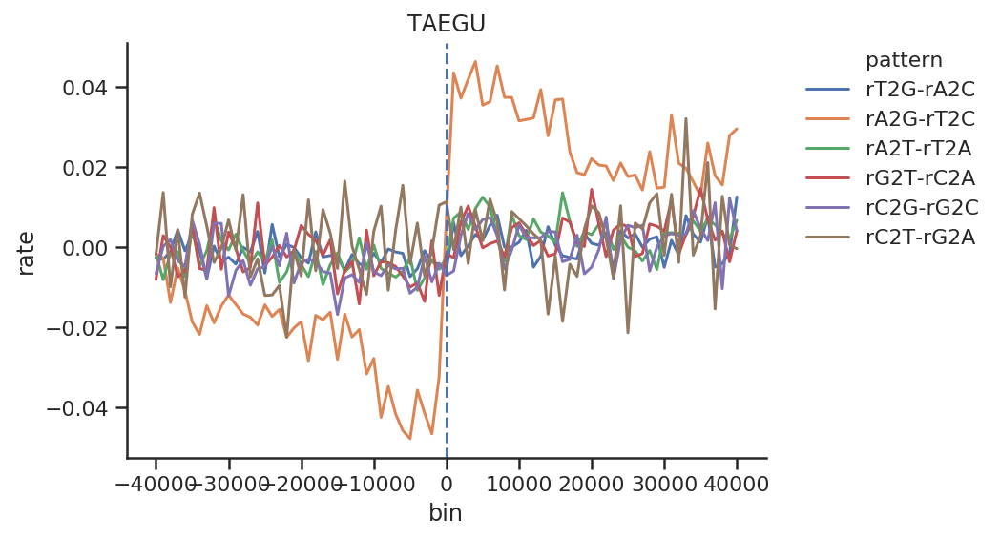

In [87]:
species = 'TAEGU'
with sns.axes_style('ticks'):
    ax = sns.lineplot('bin', 'rate', hue='pattern', ci=None, data=plot_df.loc[plot_df.species_code == species])
    sns.despine()
    plt.axvline(0, linestyle='dashed')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., frameon=False)
    plt.title(species)

Same plot for each species:

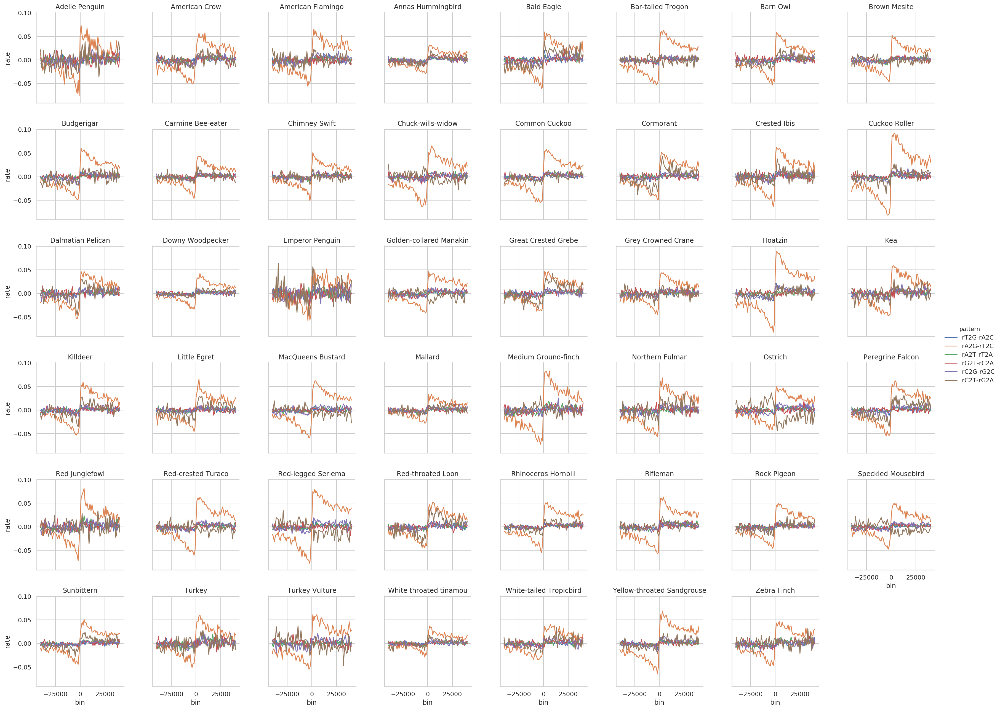

In [110]:
with sns.axes_style('whitegrid'):
    g = sns.FacetGrid(plot_df,
                      col='species', hue='pattern',
                      col_wrap=8, sharey=True)
    g = g.map(sns.lineplot, 'bin', 'rate').add_legend()
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}') ;

The `rT2G-A2G` pattern is by far the strongest, but if the other patterns are plotted on separate scales there is a clear bias there too:

Looking more closely on the strongest pattern `rA2G-rT2C` in Bald Eagle (that srongly share hotspots) and Downy Woodpecker and Ostrich (that do not), we see that these species seem to use the locations as replication origins ot the same extent. That suggests that there the use of locations as hotspots is not tied to the use as replication origins.

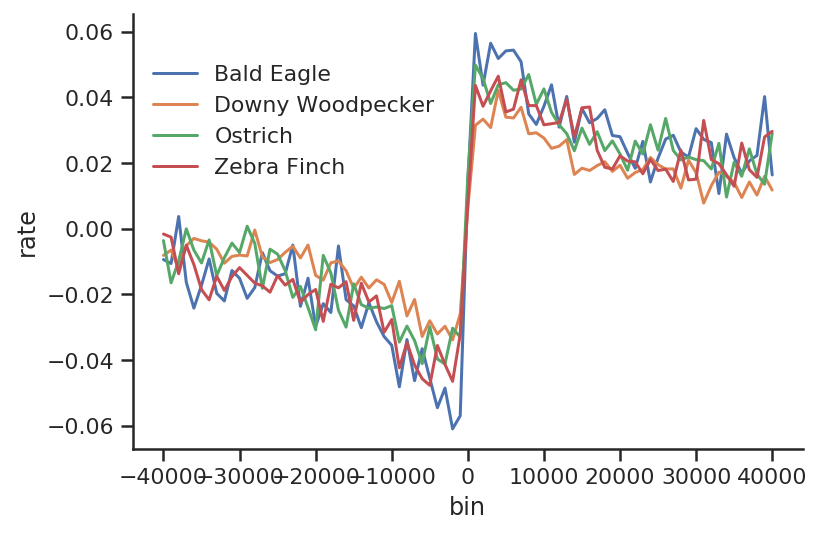

In [160]:
species = ['Zebra Finch', 'Downy Woodpecker', 'Ostrich', 'Bald Eagle']
plot_df_subset = plot_df.loc[plot_df.species.isin(species) & (plot_df.pattern == 'rA2G-rT2C')]
plot_df_subset.species.cat.remove_unused_categories(inplace=True)

with sns.axes_style('ticks'):
    sns.lineplot(x='bin', y='rate', hue='species', ci=None, data=plot_df_subset)
    sns.despine()
#    plt.axvline(x=0, linestyle='dashed')
    plt.legend(#bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., 
               frameon=False, title='')

    ax = plt.gca()
    legend = ax.legend(frameon=False)
    legend.texts[0].set_text("")

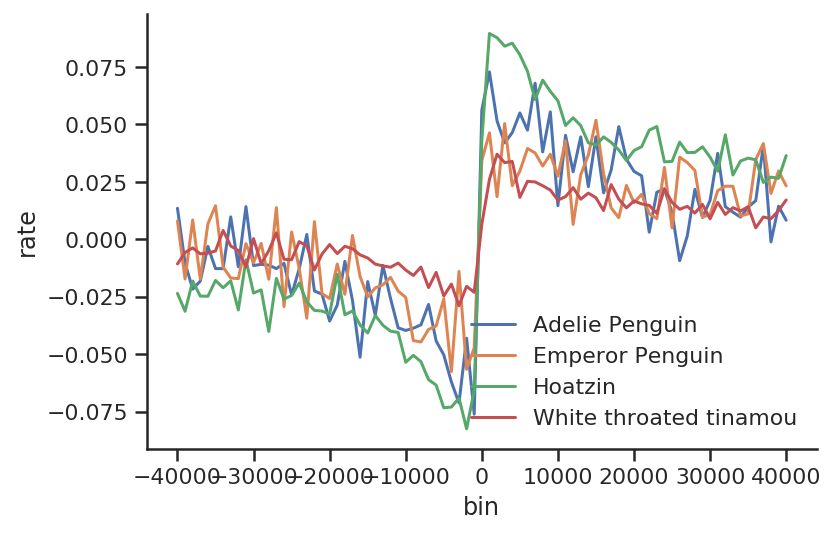

In [159]:
species = ['Hoatzin', 'White throated tinamou', 'Adelie Penguin', 'Emperor Penguin']
plot_df_subset = plot_df.loc[plot_df.species.isin(species) & (plot_df.pattern == 'rA2G-rT2C')]
plot_df_subset.species.cat.remove_unused_categories(inplace=True)

with sns.axes_style('ticks'):
    sns.lineplot(x='bin', y='rate', hue='species', ci=None, data=plot_df_subset)
    sns.despine()
#    plt.axvline(x=0, linestyle='dashed')
    plt.legend(#bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., 
               frameon=False)
    
    ax = plt.gca()
    legend = ax.legend(frameon=False)
    legend.texts[0].set_text("")

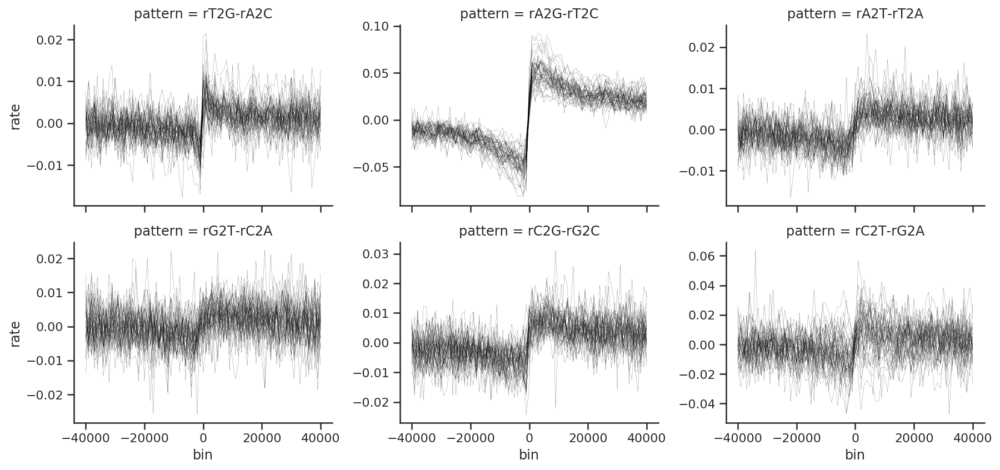

In [89]:
with sns.axes_style('ticks'):
    g = sns.FacetGrid(plot_df,
                      col='pattern', hue='species',
                      col_wrap=3, sharey=False, aspect=1.4)
    g = g.map(sns.lineplot, 'bin', 'rate', linewidth=0.1, color='black')

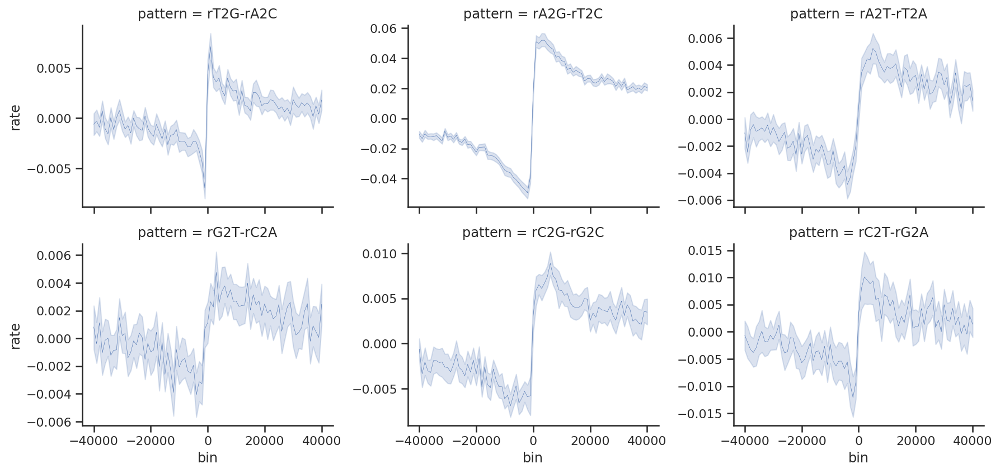

In [90]:
with sns.axes_style('ticks'):
    g = sns.FacetGrid(plot_df,
                      col='pattern',
                      col_wrap=3, sharey=False, aspect=1.4)
    g = g.map(sns.lineplot, 'bin', 'rate', linewidth=0.3)

## Compute area under bias curves (total bias)

To quantify the total bias +/- 40000bp around the hotspot, we compute the area under the curve. I.e. the summed diviation from 0.5:

In [91]:
def get_abs_area(df):
    left = np.trapz(0.5-df.loc[df.bin <= 0].rate, x=df.loc[df.bin <= 0].bin)
    right = np.trapz(df.loc[df.bin >= 0].rate-0.5, x=df.loc[df.bin >= 0].bin)
    return left + right

integrated_bias = (plot_df
                   .groupby(['species', 'species_code', 'pattern'])
                   .apply(get_abs_area)
                   .to_frame('total_bias')
                   .reset_index()
                  )

Sort by A2G-T2C bias and see if rank is preserved across all six types of bias:

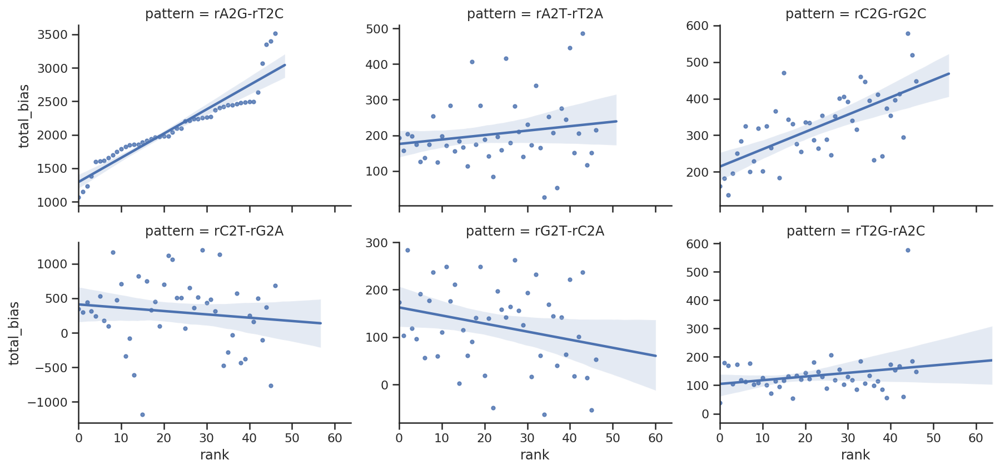

In [92]:
plot_df = (pd.pivot_table(integrated_bias,
           index=['species', 'species_code'], columns='pattern', values='total_bias')
           .sort_values('rA2G-rT2C')
           .reset_index()
           .reset_index()
           .rename(columns={'index':'rank'})
           .melt(id_vars=['rank', 'species', 'species_code'], value_name='total_bias')
          )

with sns.axes_style('ticks'):
    # sorting by pattern 
    g = sns.FacetGrid(plot_df,
                      col='pattern',
                      col_wrap=3, sharey=False, sharex=True, aspect=1.4)
    g = g.map(sns.regplot, 'rank', 'total_bias', lowess=False, scatter_kws={'s':10})
    plt.xlim(left=0)
#    g.map(plt.axhline, y=0, linestyle='dashed', color='black')

That seems to be more or less the case, although there is a lot of noise because of the small signal for the other patterns. The only other one that seems to show a significant slope is `rC2G-G2C`. 

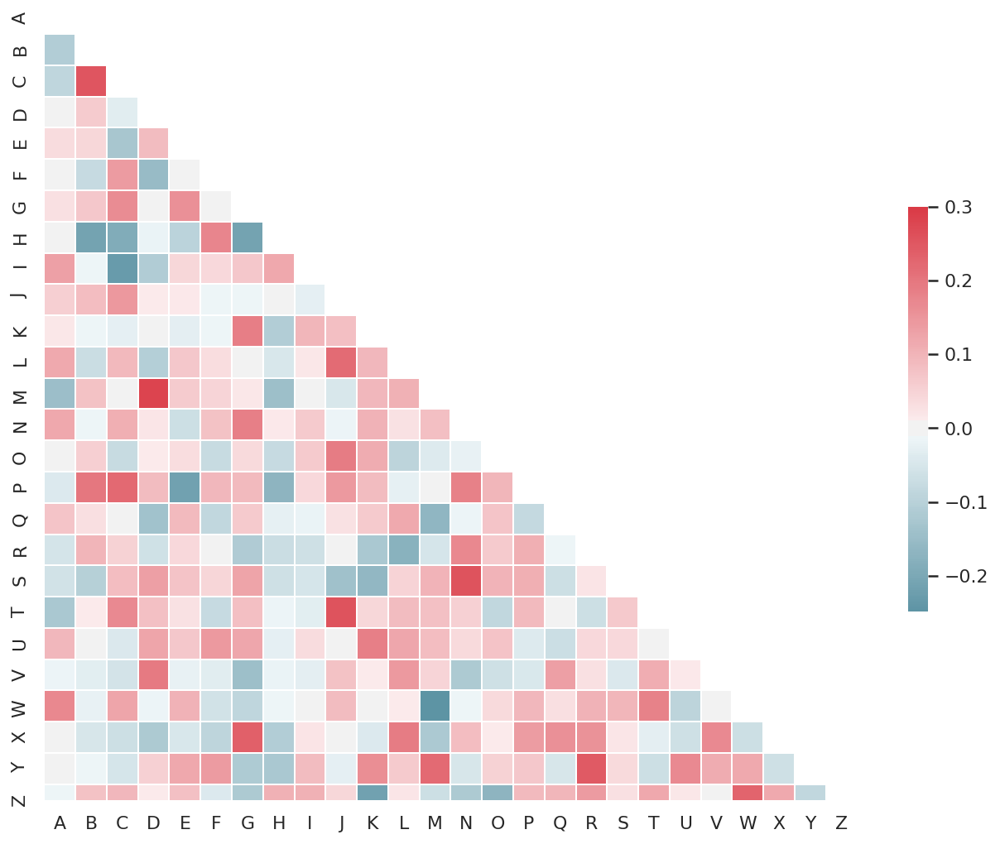

In [117]:
from string import ascii_letters
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(style="white")

# Generate a large random dataset
rs = np.random.RandomState(33)
d = pd.DataFrame(data=rs.normal(size=(100, 26)),
                 columns=list(ascii_letters[26:]))

# Compute the correlation matrix
corr = d.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=np.bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

## Bias in base composition for comparison

In [111]:
df = hotspot_data.loc[hotspot_data.bin.abs() <= 40000, ['species', 'species_code', 'bin', 'nC', 'nT', 'nG', 'nA']]
df['C-G'] = (df.nC-df.nG) / (df.nC + df.nG)
df['T-A'] = (df.nT-df.nA) / (df.nT + df.nA)
comp_data = df.melt(id_vars=['species', 'species_code', 'bin'], value_vars=['C-G', 'T-A'])

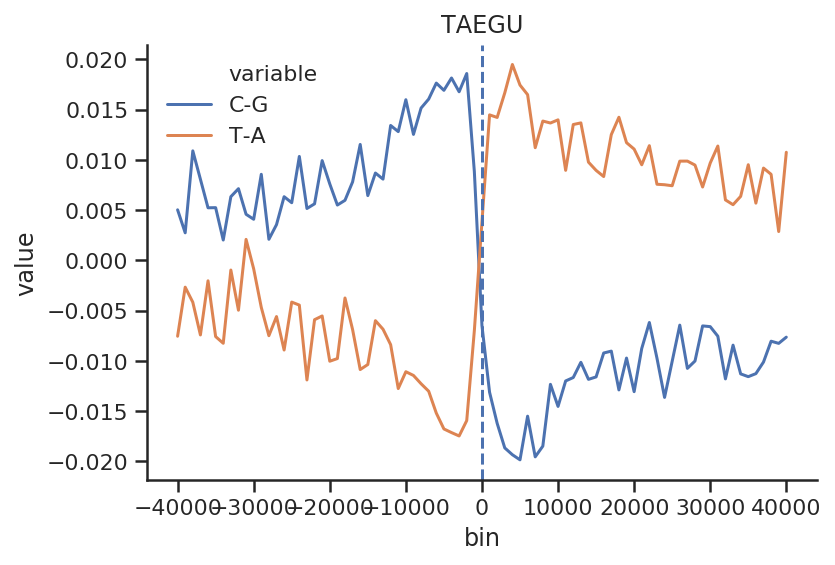

In [112]:
species = 'TAEGU'
with sns.axes_style('ticks'):
    sns.lineplot(x='bin', y='value', hue='variable', ci=None, data=comp_data.loc[comp_data.species_code==species])
    plt.title(species)
    plt.legend(#bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., 
               frameon=False)
    sns.despine()
    plt.axvline(x=0, linestyle='dashed')

Same plot for each species:

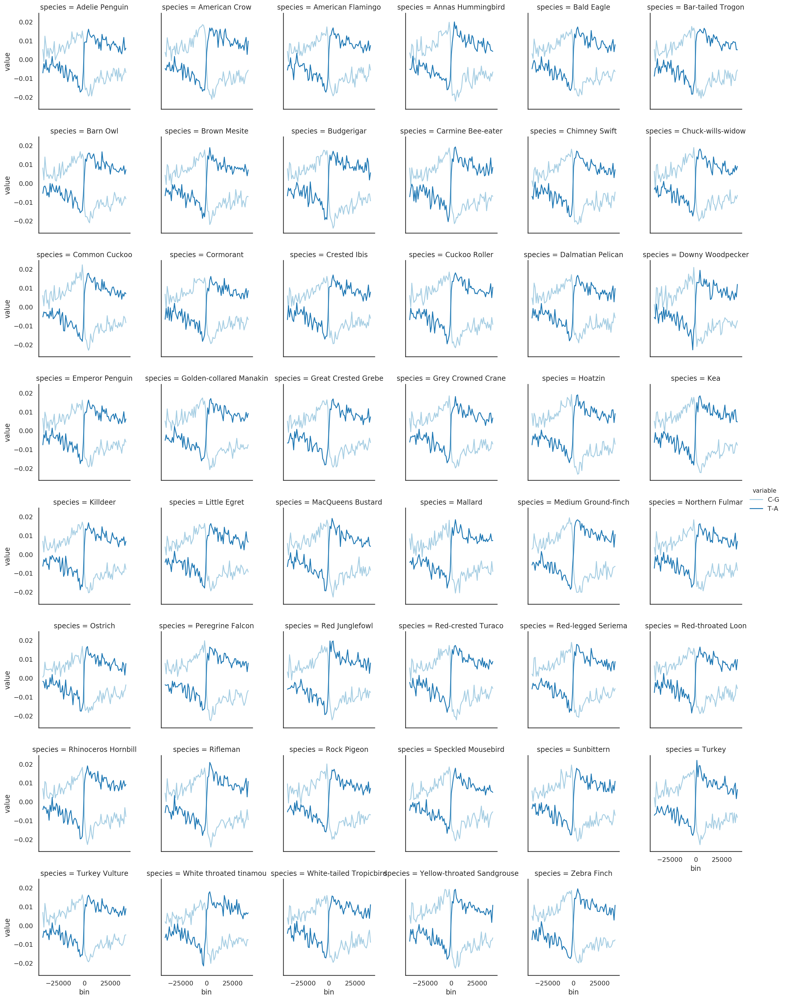

In [113]:
with sns.color_palette("Paired"):
    g = sns.FacetGrid(comp_data,
                      col='species', hue='variable',
                      col_wrap=6, sharey=True)
    g = g.map(sns.lineplot, 'bin', 'value', ci=None).add_legend()

The bias in base composition is very similar across species, reflecting that most of bias accumulated in the ancestor to all birds.

In [114]:
comp_table = pd.pivot_table(comp_data, index=['species', 'species_code', 'bin'], columns='variable', values='value').reset_index()
comp_table['(T-A)-(C-G)'] = comp_table['T-A'] - comp_table['C-G']

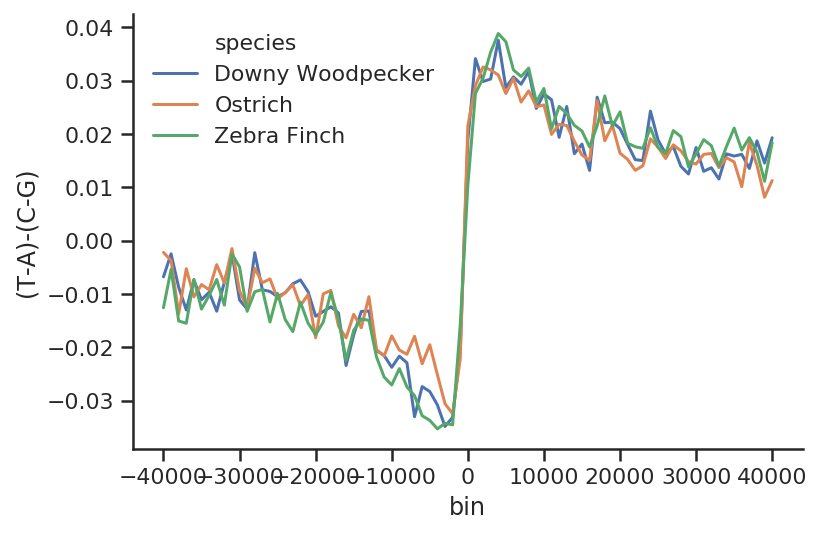

In [120]:
species = ['TAEGU', 'PICPU', 'STRCA']
plot_df = comp_table.loc[comp_table.species_code.isin(species)]
plot_df.species.cat.remove_unused_categories(inplace=True)
with sns.axes_style('ticks'):
    sns.lineplot(x='bin', y='(T-A)-(C-G)', hue='species', ci=None, data=plot_df)
    sns.despine()
#    plt.axvline(x=0, linestyle='dashed')
    plt.legend(#bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., 
               frameon=False)

Same plot for each species:

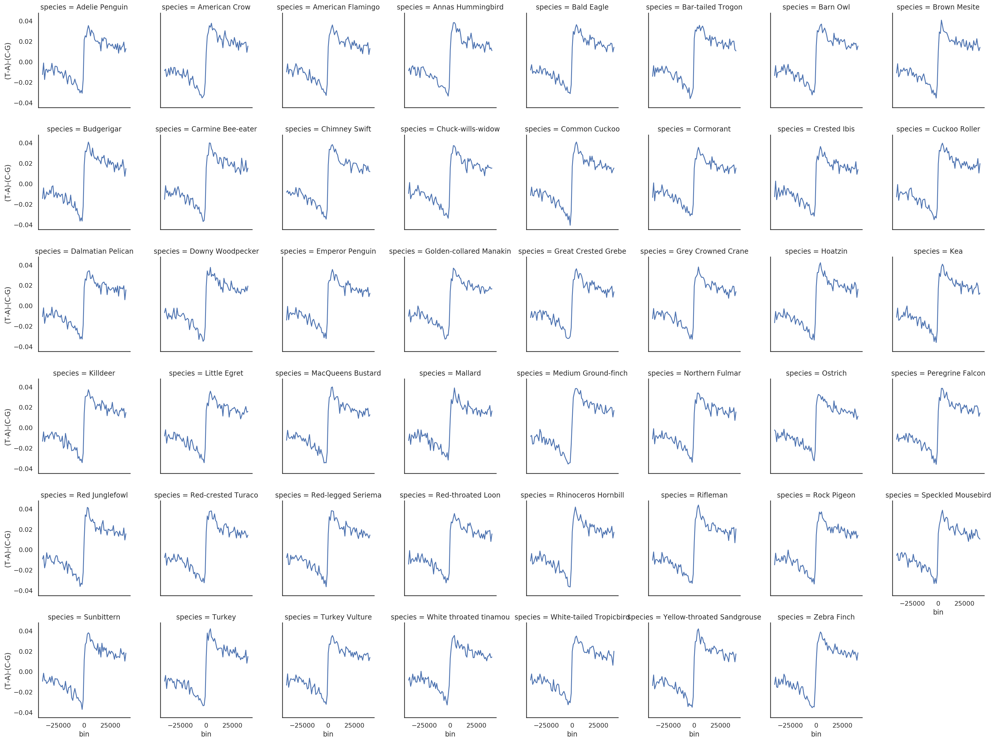

In [116]:
g = sns.FacetGrid(comp_table,
                  col='species', 
                  col_wrap=8, sharey=True)
g = g.map(sns.lineplot, 'bin', '(T-A)-(C-G)', ci=None).add_legend()